# Explicación del proyecto y los pasos a seguir

Este proyecto resuelve un problema de clasificación y acaba construyendo un clasificador con técnicas de machine learning. Es uno de los proyectos más usados en la práctica y por ello el paso a paso es tan y tan importante.


## ¿Qué es un clasificador?
Lo primero es entender qué es un clasificador.

Un clasificador es un problema de machine learning que trata de poder clasificar grupos.

Por ejemplo, dada las características de una empresa clasificarla en una empresa de éxito o no y poder estimar si va a funcionar una empresa.

Otro ejemplo, estimar si un jugador se va a lesionar o no según unas características determinadas del jugador.

Para ello, necesitamos datos pasados, de casos conocidos anteriormente y bien etiquetados para poder entrenar el algoritmo clasificador.

Por ejemplo, aquí vamos a usar un dataset de clientes de un banco. Estos, tienen unas ciertas características y se trata de poder estimar o predecir las probabilidades de que abandonen la empresa.

Para ello, usaremos un histórico de clientes para poder entrenar el algoritmo clasificador. El handicap de este proyecto es que tenemos pocos casos de abandono y muchos clientes actuales.

## Las etapas seguidas en el proyecto:
El paso a paso de análisis de datos de un proyecto clasificador es el siguiente:
1. Lectura de datos y exploración previa
2. Exploración univariada
3. Exploración multivariada + estadística inferencial: ventas vs las otras variables
4. Modelo estadístico para un problema de clasificación. Selección de variables
5. Árbol de decisión
6. Training del clasificador

¡Vamos a ir desgranando todas las etapas una a una!

# Cargar las librerías

Cargar las librerías que vamos a utilizar en el proyecto:

In [81]:
# Cargar las librerias de Python

import matplotlib.pyplot as plt # crear graficos https://matplotlib.org/
%pip install seaborn
import seaborn as sns # para crear graficos parecido a ggplot2 de R  https://seaborn.pydata.org/examples/index.html
# para instalar plotly: pip install plotly
import plotly.express as px # para graficos interactivos https://plotly.com/python/

import numpy as np # manipulacion de vectores https://numpy.org/
import pandas as pd # manipulacion de dataframes igual R https://pandas.pydata.org/getting_started.html



# Librerías estadísticas:
#-------------------------------------------------------------------------------------------------
%pip install pingouin
import pingouin as pg # paquete estadístico para test estadísticos: ANOVA, Chi Square,...
import statsmodels.api as sm # paquete de modelos estadísticos muy potente


# Librerías machine learning:
#-------------------------------------------------------------------------------------------------
import sklearn.utils.metaestimators
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report  # cálculo matriz de confusión
from sklearn.metrics import confusion_matrix # cálculo matriz de confusión
from sklearn.metrics import accuracy_score # acruracy
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier  # árbol de clasificación en sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

import missingno as msno # visualizar los valors NAs

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [82]:
# Función personalizado de buscar outliers:
# https://careerfoundry.com/en/blog/data-analytics/how-to-find-outliers/
def find_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
   return outliers

Un outlier es una observación anormal y extrema en una muestra estadística o serie temporal de datos que puede afectar potencialmente a la estimación de los parámetros del mismo.

In [83]:
plt.rcParams["figure.figsize"] = (10,5) # cambiar el tamano de las figuras

In [84]:
pd.set_option('display.max_rows', None) # mostrar todas las filas del data frame

# Lectura / importación de datos

En este ejemplo vamos a trabajar los datos de la siguiente url:
https://www.kaggle.com/datasets?select=BankChurners.csv

Las variables representadas en el dataset son las siguientes:

CLIENTNUM: Número de cliente único.

Attrition_Flag: Indicador de abandono de la institución financiera.

Customer_Age: Edad del cliente.

Gender: Género del cliente.

Dependent_count: Cantidad de dependientes del cliente.

Education_Level: Nivel educativo del cliente.

Marital_Status: Estado civil del cliente.

Income_Category: Categoría de ingresos del cliente.

Card_Category: Categoría de tarjeta de crédito del cliente.

Months_on_book: Cantidad de meses que el cliente ha estado en la institución financiera.

Total_Relationship_Count: Cantidad de productos bancarios que el cliente tiene.

Months_Inactive_12_mon: Cantidad de meses que el cliente ha estado inactivo en los últimos 12 meses.

Contacts_Count_12_mon: Cantidad de contactos que el cliente ha tenido en los últimos 12 meses.

Credit_Limit: Límite de crédito del cliente.

Total_Revolving_Bal: Saldo total de la cuenta de tarjeta de crédito revolvente del cliente.

Avg_Open_To_Buy: Promedio de la cantidad de crédito disponible en la cuenta de tarjeta de crédito del cliente.

Total_Amt_Chng_Q4_Q1: Cambio porcentual en la cantidad de transacciones realizadas en el cuarto trimestre con respecto al primer trimestre.

Total_Trans_Amt: Cantidad total de transacciones realizadas en los últimos 12 meses.

Total_Trans_Ct: Cantidad total de transacciones realizadas en los últimos 12 meses.

Total_Ct_Chng_Q4_Q1: Cambio porcentual en la cantidad total de transacciones realizadas en el cuarto trimestre con respecto al primer trimestre.

Avg_Utilization_Ratio: Promedio de la proporción entre el saldo total de la cuenta de tarjeta de crédito revolvente del cliente y el límite de crédito.



Este conjunto de datos contiene información sobre los clientes de una institución financiera y si abandonaron o no la institución. Hay un total de 21 atributos, incluyendo la edad, el género, la educación, el estado civil, la categoría de ingresos, la cantidad de productos bancarios que el cliente tiene, la fecha de apertura de la cuenta, la cantidad de transacciones realizadas en el último año, etc.

El objetivo es predecir si un cliente abandonará o no la institución en el futuro.

In [85]:
path_file = "/home/mauro/Desktop/datasets/Clientes/BankChurners.csv"
path_file

'/home/mauro/Desktop/datasets/Clientes/BankChurners.csv'

In [86]:
data = pd.read_csv(path_file,sep=",",header = 0)

In [87]:
data.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [88]:
data.tail(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10117,712503408,Existing Customer,57,M,2,Graduate,Married,$80K - $120K,Blue,40,...,3,4,17925.0,1909,16016.0,0.712,17498,111,0.820,0.106
10118,713755458,Attrited Customer,50,M,1,Unknown,Unknown,$80K - $120K,Blue,36,...,3,4,9959.0,952,9007.0,0.825,10310,63,1.100,0.096
10119,716893683,Attrited Customer,55,F,3,Uneducated,Single,Unknown,Blue,47,...,3,3,14657.0,2517,12140.0,0.166,6009,53,0.514,0.172
10120,710841183,Existing Customer,54,M,1,High School,Single,$60K - $80K,Blue,34,...,2,0,13940.0,2109,11831.0,0.660,15577,114,0.754,0.151
10121,713899383,Existing Customer,56,F,1,Graduate,Single,Less than $40K,Blue,50,...,1,4,3688.0,606,3082.0,0.570,14596,120,0.791,0.164
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189


In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [90]:
#Eliminamos la columna CLIENTNUM que solo indica el id de cada cliente
data = data.drop("CLIENTNUM", axis=1)

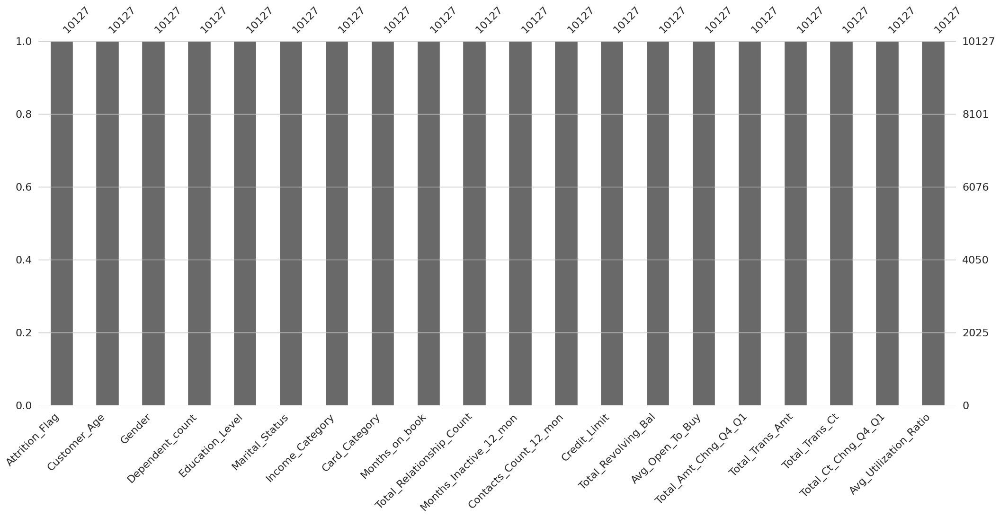

In [91]:
# Mirar los valores perdidos o nans:

# Barplot de los nans
msno.bar(data)
plt.show()

In [92]:
# Si tuvieramos nans los quitaríamos de esta manera:

data = data.dropna()

In [93]:
#Ahora vamos a convertir la variable objetivo "Attrition_Flag" en binaria 
#Reemplazamos los valores "Existing Customer" (Cliente Existente) con 0 y "Attrited Customer"	(Cliente Perdido) con 1
data['Attrition_Flag'] = data['Attrition_Flag'].replace({'Existing Customer': 0, 'Attrited Customer': 1})

In [94]:
#Vemos los ultimos registros para evidenciar los cambios en el campo
data.tail()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,0,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,1,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,1,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,1,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000
10126,1,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189


# Exploración univariada

La exploración univariada consisten en dibujar las distribuciones y calcular los estadísticos de las variables una a una. De forma individual para:

1. Identificar valores perdidos - que no existen
2. Errores y outliers
3. Visualizar la distribucion de cada variable
4. Estadisticos descriptivos de centralidad, de dispersión y de forma
5. En la descripcion de la variable respuesta

## Explorar la variable de salida: Attrition_Flag (Cliente Activo o Cliente Perdido)

*************************************************
Variable = Attrition_Flag
*************************************************
   Frecuencias Relativas  Frecuencias Absolutas
0                0.83934                   8500
1                0.16066                   1627


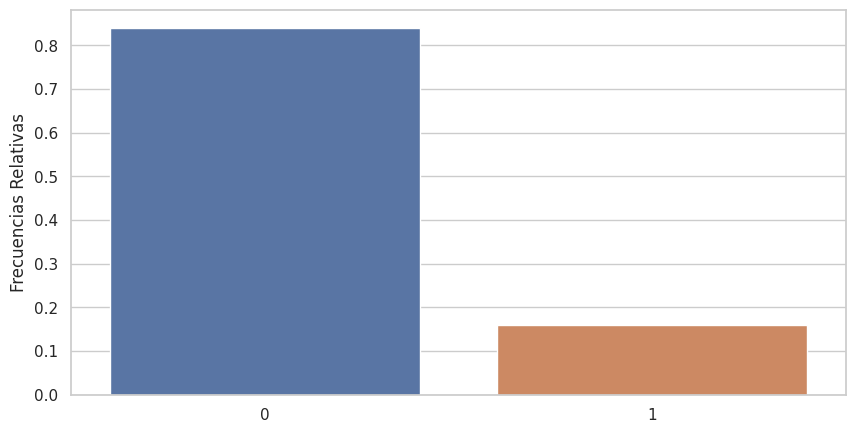

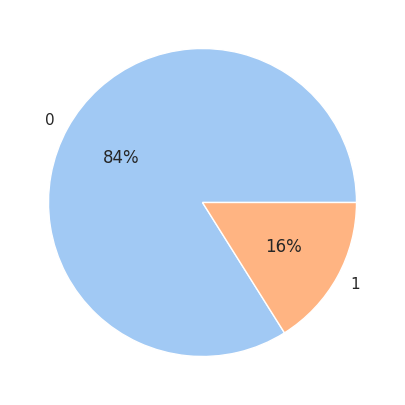

In [95]:
i = 'Attrition_Flag'
print("*************************************************")
print("Variable = "+i)
print("*************************************************")
# 1. La tabla de frecuencias de la variable i
pct = pd.DataFrame(data[i].value_counts(normalize=True))
pct.columns = ['Frecuencias Relativas']
pct["Frecuencias Absolutas"] = data[i].value_counts()
print(pct)

# 2. Barplot de la variable i
sns.barplot(x=pct.index, y='Frecuencias Relativas', data=pct)
plt.show()

# 3. Pieplot de la variable i
frec_abs = data[i].value_counts() # grabo las frecuencias absolutas
labels = data[i].value_counts().index # cojo los nombres de los grupos de variable cualitativa i 
colors = sns.color_palette('pastel')[0:len(labels)] # defino los colors según la paleta pastel de seaborn
plt.pie(frec_abs, labels = labels, colors = colors, autopct='%.0f%%') # pie plot y muestro los porcentajes
plt.show()

## Explorar todas las variables cuantitativas y sus correlaciones

In [96]:
# Estadístico descriptivos:

# Selecionamos las variables:
var_num = ['Customer_Age',
           'Dependent_count',
           'Months_on_book',
           'Total_Relationship_Count',
           'Months_Inactive_12_mon',
           'Contacts_Count_12_mon',
           'Credit_Limit',
           'Total_Revolving_Bal',
           'Avg_Open_To_Buy',
           'Total_Amt_Chng_Q4_Q1',
           'Total_Trans_Amt',
           'Total_Trans_Ct',
           'Total_Ct_Chng_Q4_Q1',
           'Avg_Utilization_Ratio']
# Medidas de centralidad: Media y mediana
media = data[var_num].mean()
mediana = data[var_num].median()
Estadisticos_descriptivos = pd.DataFrame({'Media': media, 'Mediana': mediana})


# Medidas de dispersión: desviación estándar y rango intercuartílico (IQR)
desv = data[var_num].std()
q1 = data[var_num].quantile(0.25)
q3 = data[var_num].quantile(0.75)
iqr = q3-q1
Estadisticos_descriptivos['Desviación Estándar'] = desv
Estadisticos_descriptivos['Cuartil 1'] = q1
Estadisticos_descriptivos['Cuartil 3'] = q3
Estadisticos_descriptivos['IQR'] = iqr

# Error estándar y intervalos de confianza de la media al 95% y 99%
Estadisticos_descriptivos['n'] = len(data) # numero de observaciones
Estadisticos_descriptivos['Error Estandar'] = desv/np.sqrt(len(data)) # numero de observaciones
Estadisticos_descriptivos['IC lower 95%'] = media-1.96*Estadisticos_descriptivos['Error Estandar'] 
Estadisticos_descriptivos['IC upper 95%'] = media+1.96*Estadisticos_descriptivos['Error Estandar']
Estadisticos_descriptivos['IC lower 95%'] = media-1.96*Estadisticos_descriptivos['Error Estandar']
Estadisticos_descriptivos['IC upper 95%'] = media+1.96*Estadisticos_descriptivos['Error Estandar']

Estadisticos_descriptivos

,Media,Mediana,Desviación Estándar,Cuartil 1,Cuartil 3,IQR,n,Error Estandar,IC lower 95%,IC upper 95%
Customer_Age,46.325960,46.000,8.016814,41.000,52.000,11.000,10127,0.079664,46.169819,46.482101
Dependent_count,2.346203,2.000,1.298908,1.000,3.000,2.000,10127,0.012907,2.320905,2.371502
Months_on_book,35.928409,36.000,7.986416,31.000,40.000,9.000,10127,0.079362,35.772860,36.083958
Total_Relationship_Count,3.812580,4.000,1.554408,3.000,5.000,2.000,10127,0.015446,3.782305,3.842855
Months_Inactive_12_mon,2.341167,2.000,1.010622,2.000,3.000,1.000,10127,0.010043,2.321484,2.360851
Contacts_Count_12_mon,2.455317,2.000,1.106225,2.000,3.000,1.000,10127,0.010993,2.433772,2.476863
Credit_Limit,8631.953698,4549.000,9088.776650,2555.000,11067.500,8512.500,10127,90.316069,8454.934203,8808.973193
Total_Revolving_Bal,1162.814061,1276.000,814.987335,359.000,1784.000,1425.000,10127,8.098609,1146.940787,1178.687336
Avg_Open_To_Buy,7469.139637,3474.000,9090.685324,1324.500,9859.000,8534.500,10127,90.335036,7292.082967,7646.196306
Total_Amt_Chng_Q4_Q1,0.759941,0.736,0.219207,0.631,0.859,0.228,10127,0.002178,0.755671,0.764210


/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


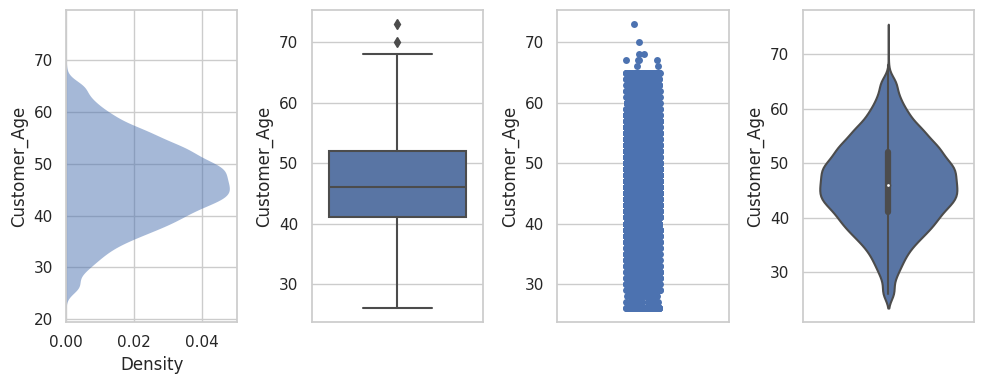

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


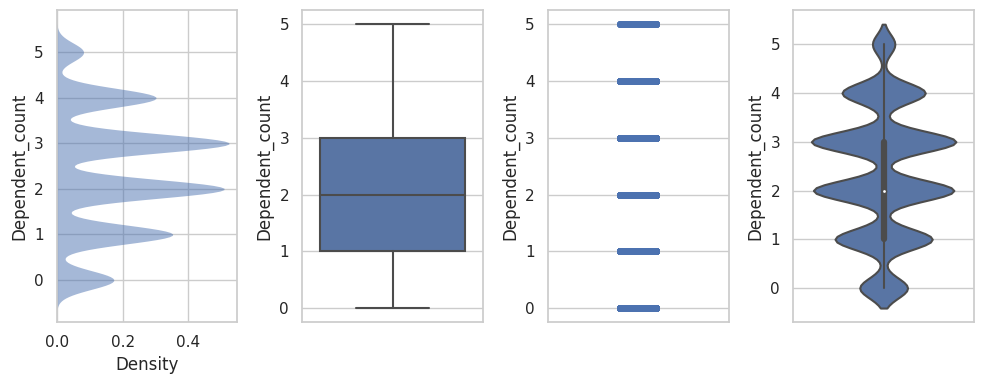

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


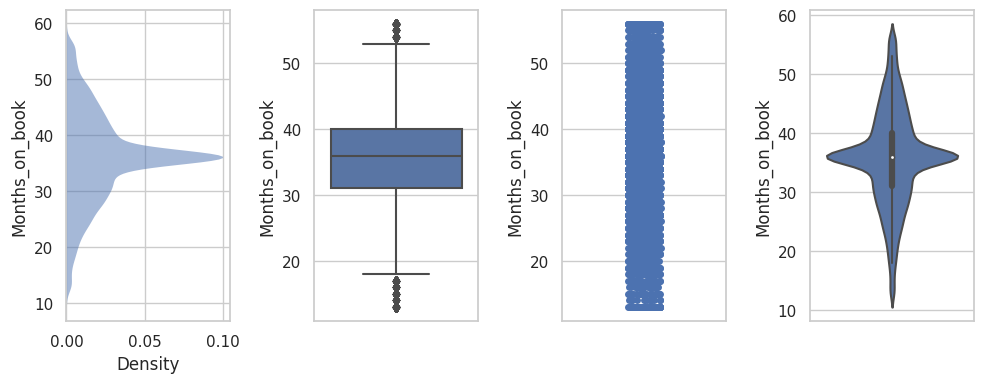

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


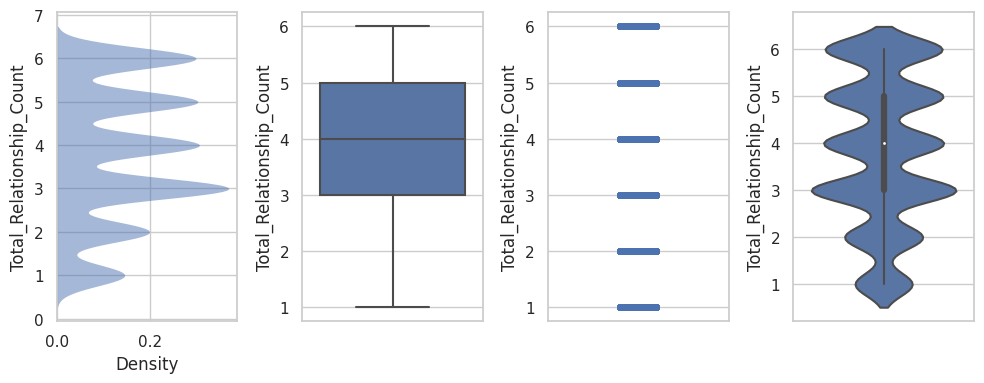

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


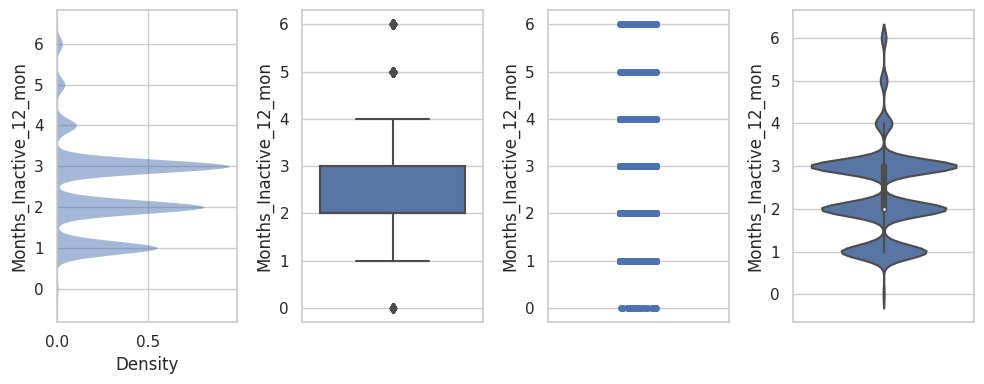

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


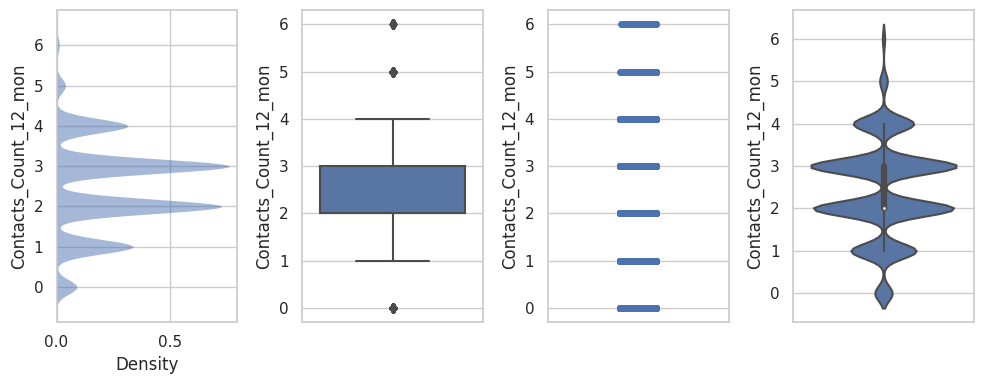

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


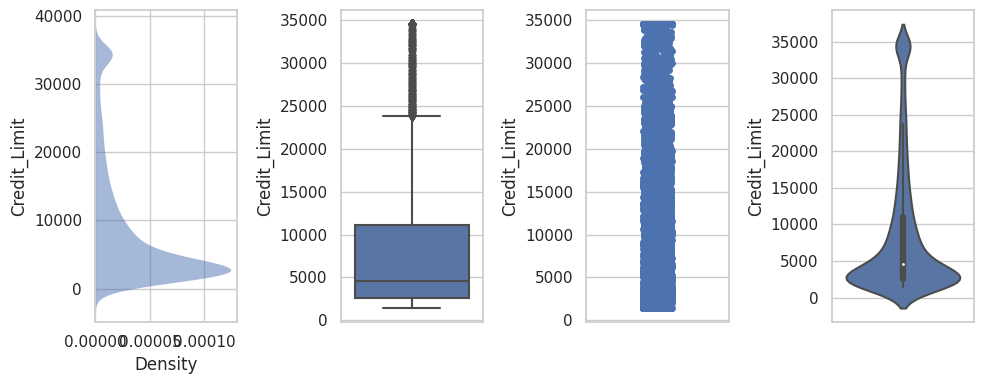

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


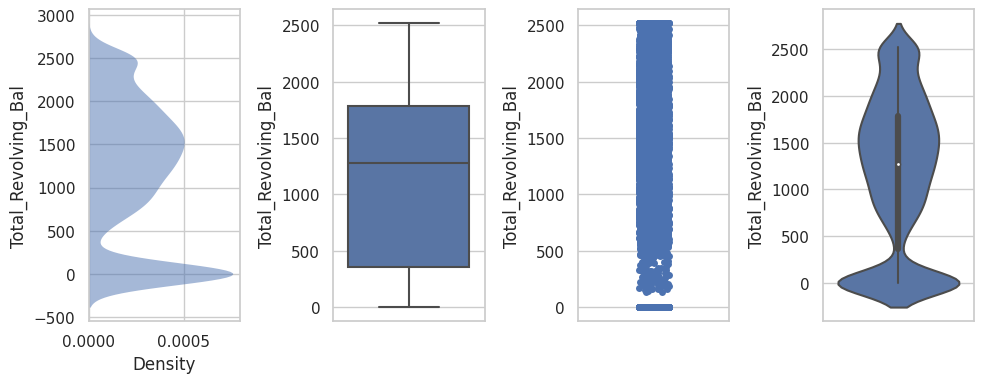

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


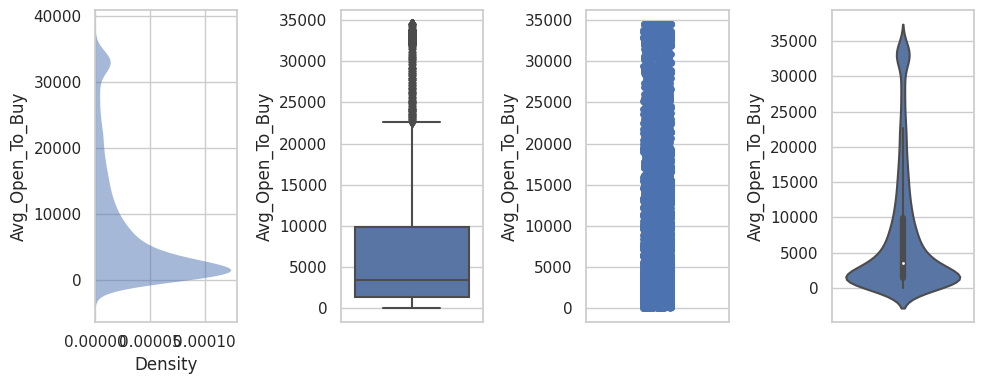

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


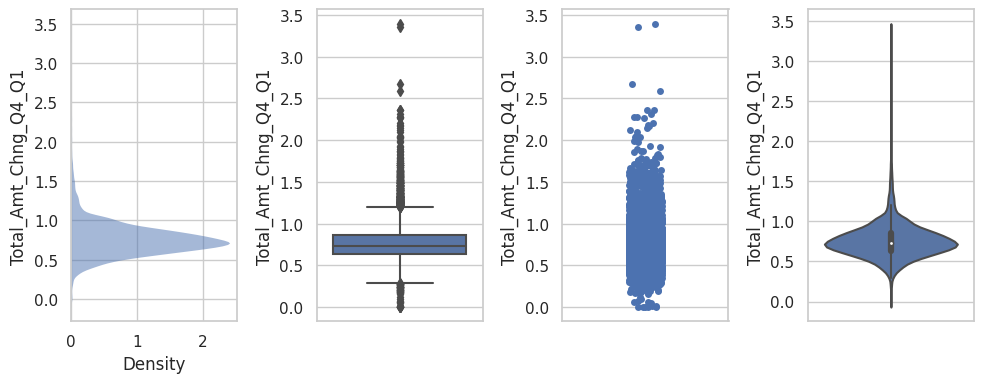

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


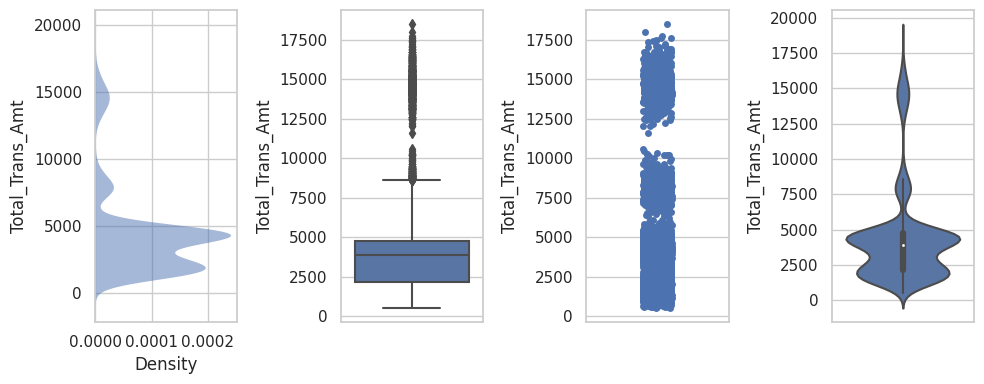

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


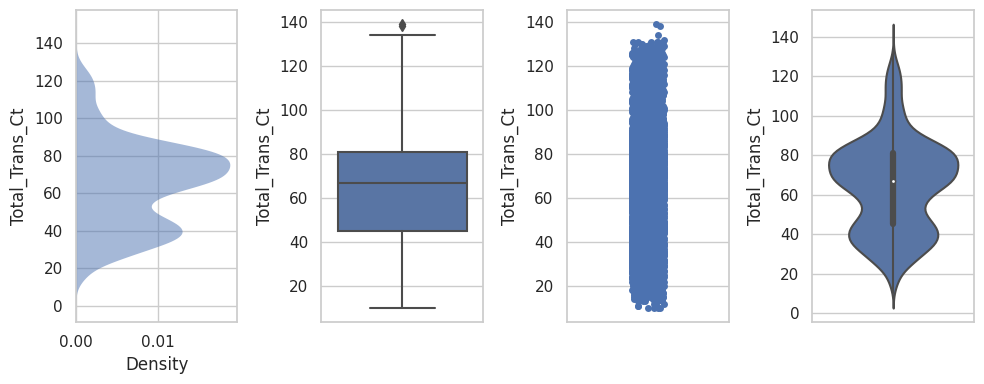

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


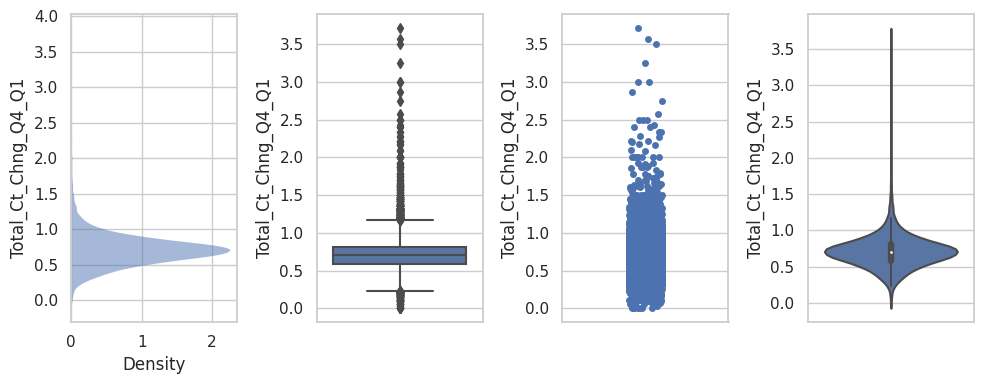

/tmp/ipykernel_25504/1667666241.py:22: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(


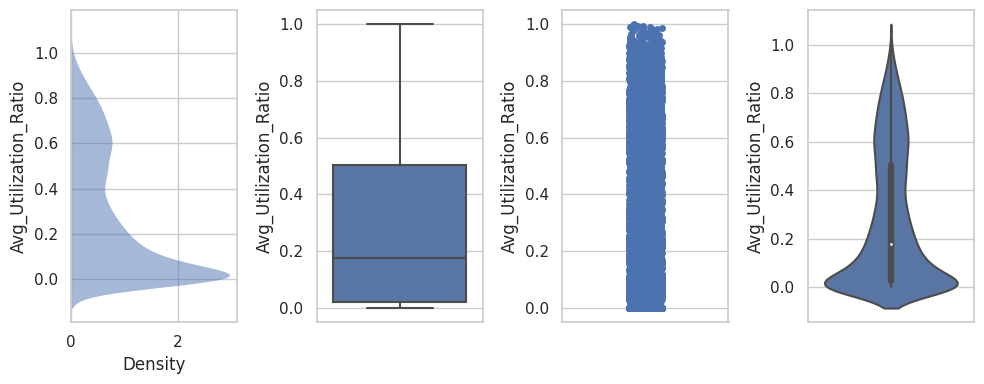

In [97]:
# Distribuciones: densidad, boxplot, astripchart, violinplot:

# Escogemos las variable numéricas:
var_num = ['Customer_Age',
           'Dependent_count',
           'Months_on_book',
           'Total_Relationship_Count',
           'Months_Inactive_12_mon',
           'Contacts_Count_12_mon',
           'Credit_Limit',
           'Total_Revolving_Bal',
           'Avg_Open_To_Buy',
           'Total_Amt_Chng_Q4_Q1',
           'Total_Trans_Amt',
           'Total_Trans_Ct',
           'Total_Ct_Chng_Q4_Q1',
           'Avg_Utilization_Ratio']

# Histograma de densidad, boxplot, stripchart y violin plot:
for i in var_num:
    fig, axs = plt.subplots(ncols=4, figsize=(10, 4))
    sns.kdeplot(
       data=data, y=i,
       fill=True, common_norm=False, palette="crest",
       alpha=.5, linewidth=0, ax=axs[0])
    sns.boxplot(data=data, y=i,ax=axs[1])
    sns.stripplot(y= i,data=data,ax=axs[2])
    sns.violinplot(data=data, y=i,ax=axs[3])
    fig.tight_layout()
    plt.show()

In [98]:
# outliers de Customer_Age
data.loc[find_outliers_IQR(data['Customer_Age']).index,:]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
251,0,73,M,0,High School,Married,$40K - $60K,Blue,36,5,3,2,4469.0,1125,3344.0,1.363,1765,34,1.615,0.252
254,0,70,M,0,High School,Married,Less than $40K,Blue,56,3,2,3,3252.0,1495,1757.0,0.581,1227,15,0.875,0.460


In [99]:
# outliers de Total_Amt_Chng_Q4_Q1
# data.loc[find_outliers_IQR(data['Total_Amt_Chng_Q4_Q1']).index,:]
outlier_indices = find_outliers_IQR(data['Total_Amt_Chng_Q4_Q1']).index
outlier_df = data.loc[outlier_indices,:]
num_outliers = len(outlier_indices)
print(f"{num_outliers} filas fueron eliminadas.")
outlier_df.head()


396 filas fueron eliminadas.


,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [100]:
# outliers de Total_Ct_Chng_Q4_Q1
#data.loc[find_outliers_IQR(data['Total_Ct_Chng_Q4_Q1']).index,:]
outlier_indices = find_outliers_IQR(data['Total_Ct_Chng_Q4_Q1']).index
outlier_df = data.loc[outlier_indices,:]
num_outliers = len(outlier_indices)
print(f"{num_outliers} filas fueron eliminadas.")
outlier_df.head()

394 filas fueron eliminadas.


,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [101]:
# outliers de Credit_Limit
# data.loc[find_outliers_IQR(data['Credit_Limit']).index,:]
outlier_indices = find_outliers_IQR(data['Credit_Limit']).index
outlier_df = data.loc[outlier_indices,:]
num_outliers = len(outlier_indices)
print(f"{num_outliers} filas fueron eliminadas.")
outlier_df.head()

984 filas fueron eliminadas.


,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6,0,51,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,0,32,M,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
16,0,48,M,4,Post-Graduate,Single,$80K - $120K,Blue,36,6,2,3,30367.0,2362,28005.0,1.708,1671,27,0.929,0.078
40,0,45,M,3,Graduate,Single,$80K - $120K,Blue,41,2,2,2,32426.0,578,31848.0,1.042,1109,28,0.474,0.018
45,0,49,M,4,Uneducated,Single,$80K - $120K,Blue,30,3,2,3,34516.0,0,34516.0,1.621,1444,28,1.333,0.000


In [102]:
# outliers de Months_on_book
# data.loc[find_outliers_IQR(data['Months_on_book']).index,:]
outlier_indices = find_outliers_IQR(data['Months_on_book']).index
outlier_df = data.loc[outlier_indices,:]
num_outliers = len(outlier_indices)
print(f"{num_outliers} filas fueron eliminadas.")
outlier_df.head()

386 filas fueron eliminadas.


,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
11,0,65,M,1,Unknown,Married,$40K - $60K,Blue,54,6,2,3,9095.0,1587,7508.0,1.433,1314,26,1.364,0.174
18,0,61,M,1,High School,Married,$40K - $60K,Blue,56,2,2,3,3193.0,2517,676.0,1.831,1336,30,1.143,0.788
27,0,63,M,1,Unknown,Married,$60K - $80K,Blue,56,3,3,2,10215.0,1010,9205.0,0.843,1904,40,1.000,0.099
39,1,66,F,0,Doctorate,Married,Unknown,Blue,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077
52,0,66,F,0,High School,Married,Less than $40K,Blue,54,3,4,2,3171.0,2179,992.0,1.224,1946,38,1.923,0.687


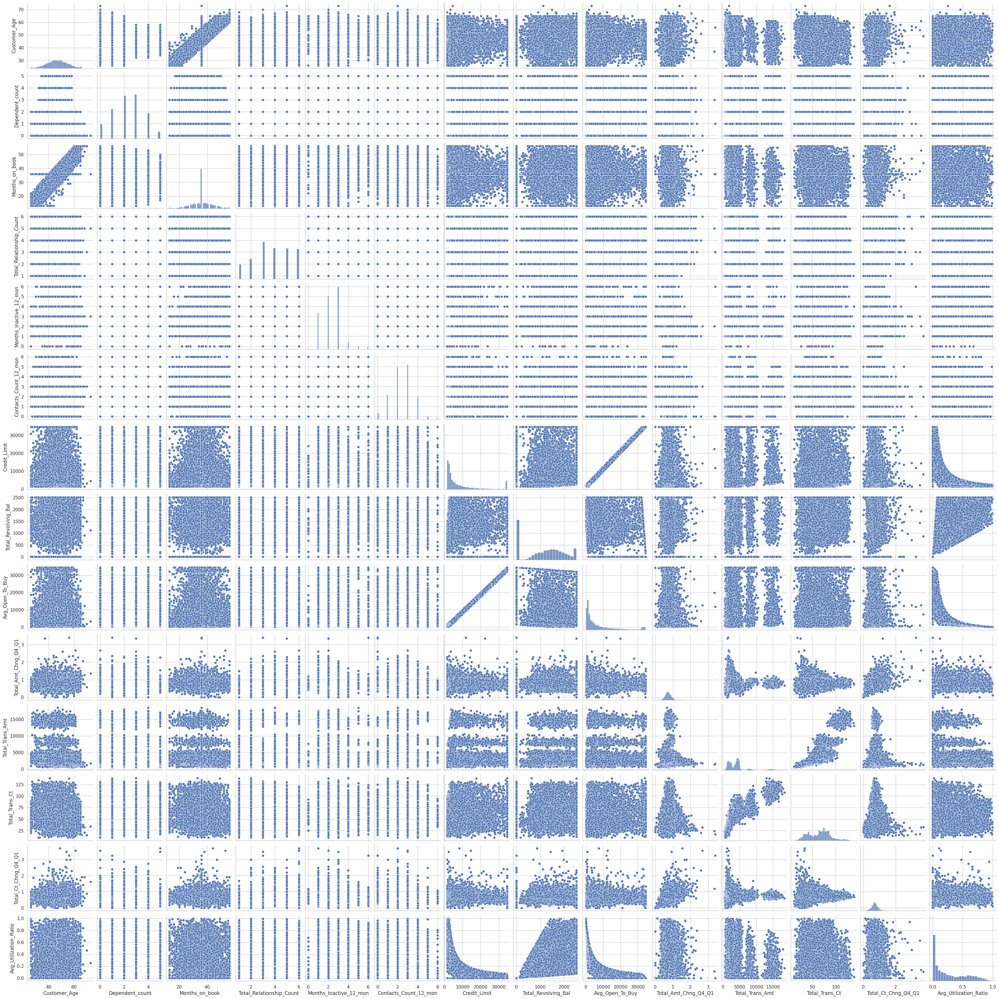

In [103]:
# Matrixplot
columnas_plot = ['Customer_Age',
                'Dependent_count',
                'Months_on_book',
                'Total_Relationship_Count',
                'Months_Inactive_12_mon',
                'Contacts_Count_12_mon',
                'Credit_Limit',
                'Total_Revolving_Bal',
                'Avg_Open_To_Buy',
                'Total_Amt_Chng_Q4_Q1',
                'Total_Trans_Amt',
                'Total_Trans_Ct',
                'Total_Ct_Chng_Q4_Q1',
                'Avg_Utilization_Ratio']
# seaborn
#sns.pairplot(data[var_num])
sns.pairplot(data[columnas_plot])
plt.show()

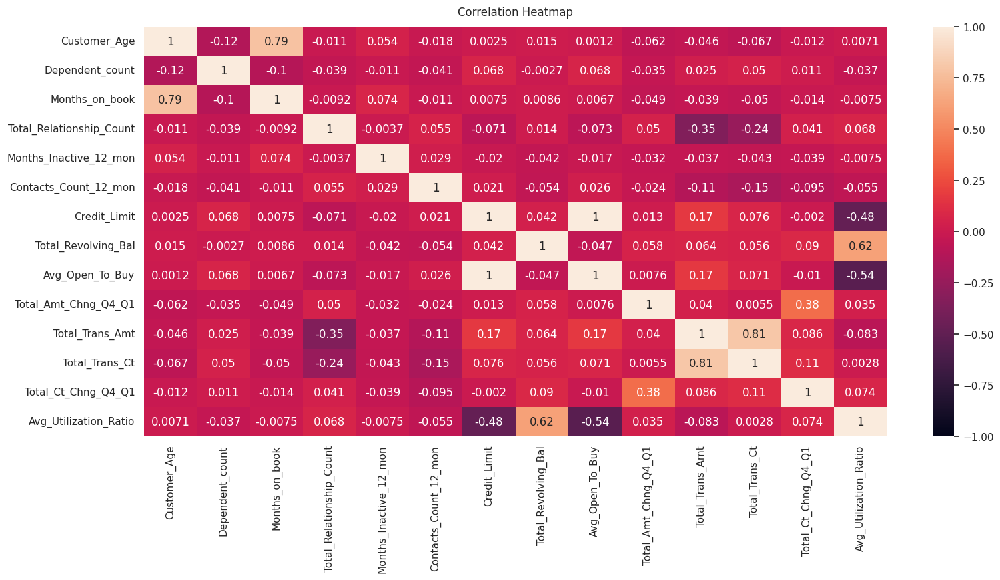

In [104]:
# Correlograma:

columnas_plot = ['Customer_Age',
                'Dependent_count',
                'Months_on_book',
                'Total_Relationship_Count',
                'Months_Inactive_12_mon',
                'Contacts_Count_12_mon',
                'Credit_Limit',
                'Total_Revolving_Bal',
                'Avg_Open_To_Buy',
                'Total_Amt_Chng_Q4_Q1',
                'Total_Trans_Amt',
                'Total_Trans_Ct',
                'Total_Ct_Chng_Q4_Q1',
                'Avg_Utilization_Ratio']

X = data[columnas_plot]

# Increase the size of the heatmap.
plt.figure(figsize=(18, 8))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(X.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);
plt.show()

## Explorar variables cualitativas

*************************************************
Variable = Gender
*************************************************
   Frecuencias Relativas  Frecuencias Absolutas
F               0.529081                   5358
M               0.470919                   4769


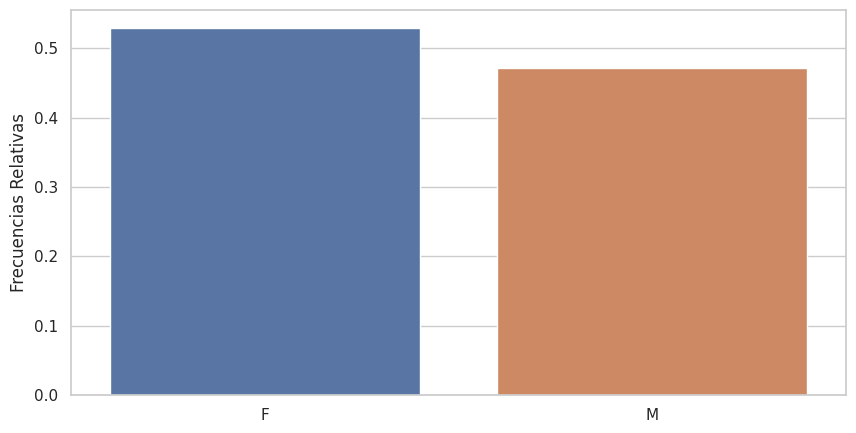

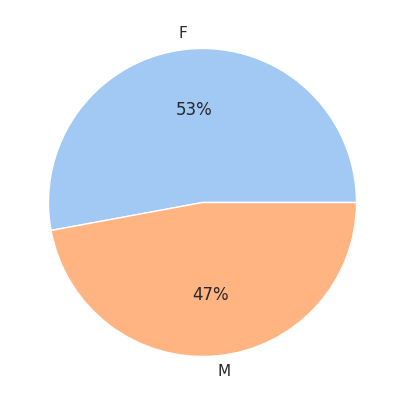

*************************************************
*************************************************
Variable = Education_Level
*************************************************
               Frecuencias Relativas  Frecuencias Absolutas
Graduate                    0.308877                   3128
High School                 0.198776                   2013
Unknown                     0.149995                   1519
Uneducated                  0.146835                   1487
College                     0.100030                   1013
Post-Graduate               0.050953                    516
Doctorate                   0.044534                    451


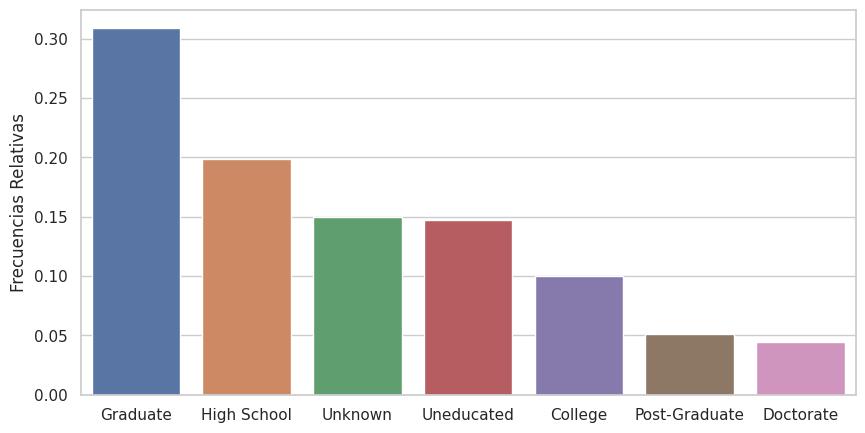

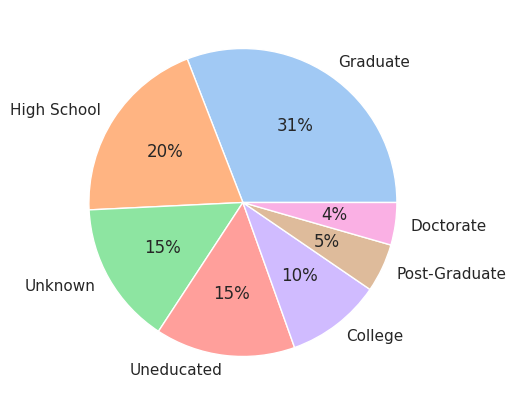

*************************************************
*************************************************
Variable = Marital_Status
*************************************************
          Frecuencias Relativas  Frecuencias Absolutas
Married                0.462822                   4687
Single                 0.389355                   3943
Unknown                0.073961                    749
Divorced               0.073862                    748


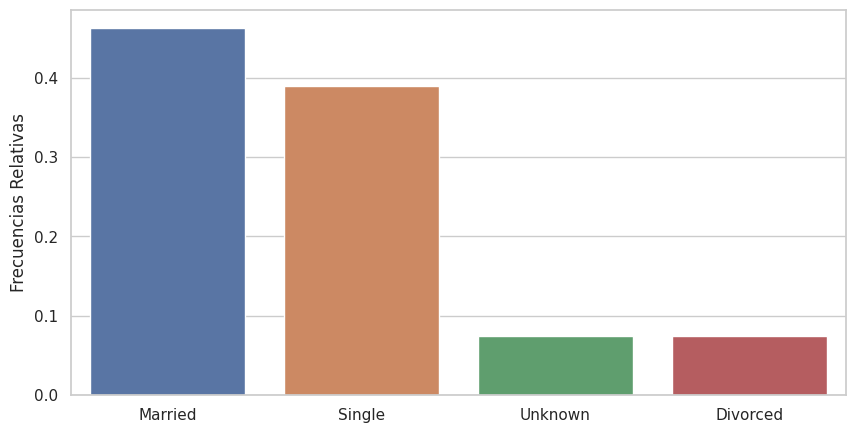

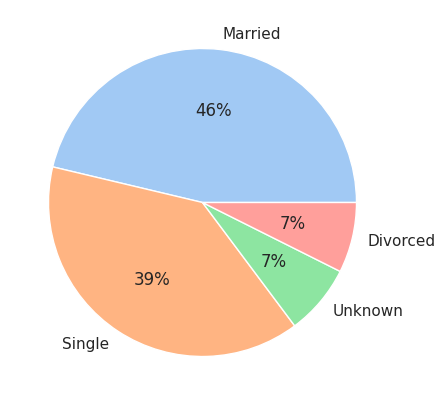

*************************************************
*************************************************
Variable = Income_Category
*************************************************
                Frecuencias Relativas  Frecuencias Absolutas
Less than $40K               0.351634                   3561
$40K - $60K                  0.176755                   1790
$80K - $120K                 0.151575                   1535
$60K - $80K                  0.138442                   1402
Unknown                      0.109805                   1112
$120K +                      0.071788                    727


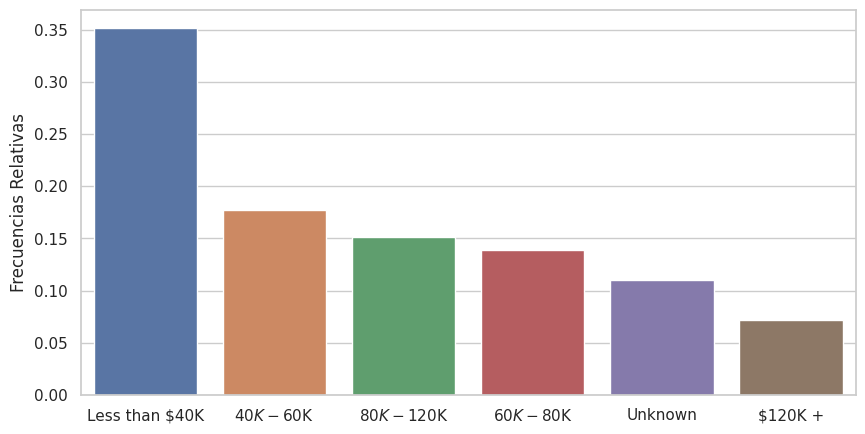

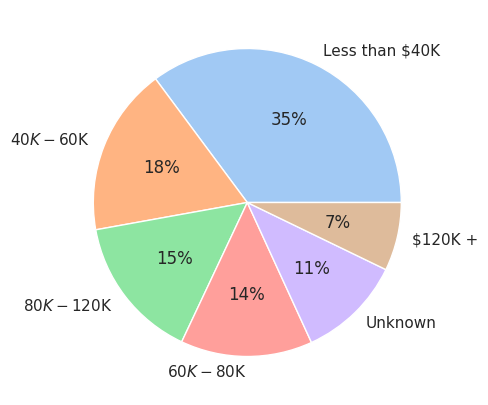

*************************************************
*************************************************
Variable = Card_Category
*************************************************
          Frecuencias Relativas  Frecuencias Absolutas
Blue                   0.931767                   9436
Silver                 0.054804                    555
Gold                   0.011455                    116
Platinum               0.001975                     20


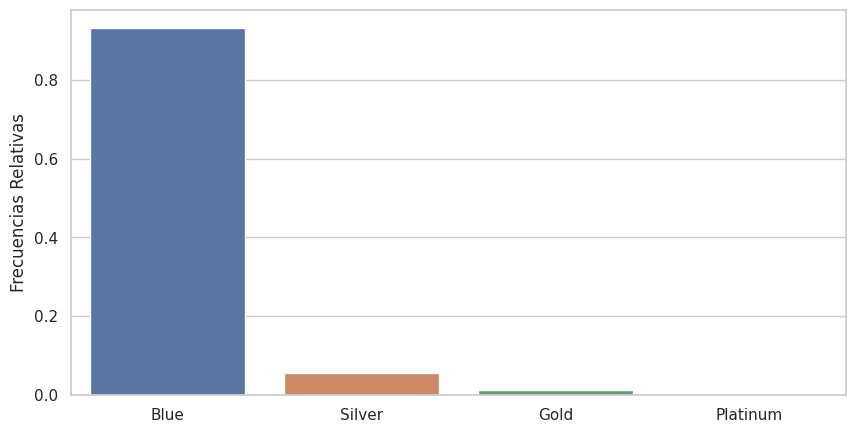

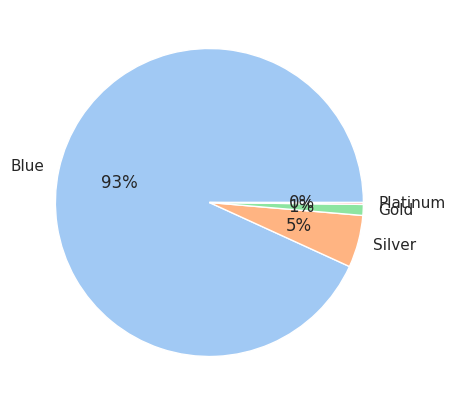

*************************************************


In [105]:
# gráficos y tablas de frecuencias de todas las variables cualitativas:

var_cual = ['Gender', 
            'Education_Level',
            'Marital_Status', 
            'Income_Category',
            'Card_Category'
            ]

for i in var_cual:
    
    print("*************************************************")
    print("Variable = "+i)
    print("*************************************************")
    
    # 1. La tabla de frecuencias de la variable i
    pct = pd.DataFrame(data[i].value_counts(normalize=True))
    pct.columns = ['Frecuencias Relativas']
    pct["Frecuencias Absolutas"] = data[i].value_counts()
    print(pct)
    
    # 2. Barplot de la variable i
    sns.barplot(x=pct.index, y='Frecuencias Relativas', data=pct)
    plt.show()
    
    # 3. Pieplot de la variable i
    frec_abs = data[i].value_counts() # grabo las frecuencias absolutas
    labels = data[i].value_counts().index # cojo los nombres de los grupos de variable cualitativa i 
    colors = sns.color_palette('pastel')[0:len(labels)] # defino los colors según la paleta pastel de seaborn
    plt.pie(frec_abs, labels = labels, colors = colors, autopct='%.0f%%') # pie plot y muestro los porcentajes
    plt.show()
    
    print("*************************************************")
    

# Explorar la relación del Attrition_Flag con las demás variables

En este apartado vamos a relacionar por parejas de las varibles de entrada con la salida.

En este proyecto la salida es el Attrition_Flag y las entradas son las demás variables que nos dan información del cliente.

Para ello hemos construido 2 apartados que son las 2 opciones que tenemos para relacionar dos variables en este proyecto:

Nuestra variable se considera cualitativa y binaria entonces:
- 5.1. Attrition_Flag (cualitativa) vs las variables numéricas --> comparación de medias (ANOVA, Kruskall Wallis)
- 5.2. Attrition_Flag (cualitativa) vs las variables cualitativas --> comparación proporciones (Chi cuadrado) 

## Attrition_Flag vs las variables numéricas --> comparación de medias (ANOVA, Kruskall Wallis)

En este apartado queremos comparar las medias poblacionales por grupos de stroke.

Para ello, pintaremos la tabla de estadísticos (media, mediana, intervalor de confianza...) por grupos de stroke.

Después realizaremos dos test estadísticos: ANOVA (paramétrico) y Kruskall Wallis (no paramétrico).
    
Mostramos los gráficos y miraremos cuáles de las variables son significativas.

¡A por ello!

In [106]:
# Estadísticos descriptivos por grupos de Attrition_Flag :

x = "Attrition_Flag" # selecciona la variable cualitativa o factor
y =  ['Customer_Age',
      'Dependent_count',
      'Months_on_book',
      'Total_Relationship_Count',
      'Months_Inactive_12_mon',
      'Contacts_Count_12_mon',
      'Credit_Limit',
      'Total_Revolving_Bal',
      'Avg_Open_To_Buy',
      'Total_Amt_Chng_Q4_Q1',
      'Total_Trans_Amt',
      'Total_Trans_Ct',
      'Total_Ct_Chng_Q4_Q1',
      'Avg_Utilization_Ratio'] # selecciona las variables numéricas

vec_var = np. append(x, y) # vector de las variables

# calcularmos los estadísticos descriptivos:
df1=(data[vec_var].groupby(x)
         .describe()
         .unstack()
         .unstack(1))
df1['se'] = df1['std']/np.sqrt(df1['count'])# error estándar
df1['ic 95 lower'] = df1['mean']-1.96*df1['se']
df1['ic 95 upper'] = df1['mean']+1.96*df1['se']
df1['iqr'] = df1['75%']-df1['25%']
df1

count         mean          std  \
                         Attrition_Flag                                     
Customer_Age             0               8500.0    46.262118     8.081157   
                         1               1627.0    46.659496     7.665652   
Dependent_count          0               8500.0     2.335412     1.303229   
                         1               1627.0     2.402581     1.275010   
Months_on_book           0               8500.0    35.880588     8.021810   
                         1               1627.0    36.178242     7.796548   
Total_Relationship_Count 0               8500.0     3.914588     1.528949   
                         1               1627.0     3.279656     1.577782   
Months_Inactive_12_mon   0               8500.0     2.273765     1.016741   
                         1               1627.0     2.693301     0.899623   
Contacts_Count_12_mon    0               8500.0     2.356353     1.081436   
                         1               1627.0     2.972342     1.090537   
Credit_Limit             0               8500.0  8726.877518  9084.969807   
                         1               1627.0  8136.039459  9095.334105   
Total_Revolving_Bal      0               8500.0  1256.604118   757.745354   
                         1               1627.0   672.822987   921.385582   
Avg_Open_To_Buy          0               8500.0  7470.273400  9087.671862   
                         1               1627.0  7463.216472  9109.208129   
Total_Amt_Chng_Q4_Q1     0               8500.0     0.772510     0.217783   
                         1               1627.0     0.694277     0.214924   
Total_Trans_Amt          0               8500.0  4654.655882  3512.772635   
                         1               1627.0  3095.025814  2308.227629   
Total_Trans_Ct           0               8500.0    68.672588    22.919011   
                         1               1627.0    44.933620    14.568429   
Total_Ct_Chng_Q4_Q1      0               8500.0     0.742434     0.228054   
                         1               1627.0     0.554386     0.226854   
Avg_Utilization_Ratio    0               8500.0     0.296412     0.272568   
                         1               1627.0     0.162475     0.264458   

                                              min        25%       50%  \
                         Attrition_Flag                                  
Customer_Age             0                 26.000    41.0000    46.000   
                         1                 26.000    41.0000    47.000   
Dependent_count          0                  0.000     1.0000     2.000   
                         1                  0.000     2.0000     2.000   
Months_on_book           0                 13.000    31.0000    36.000   
                         1                 13.000    32.0000    36.000   
Total_Relationship_Count 0                  1.000     3.0000     4.000   
                         1                  1.000     2.0000     3.000   
Months_Inactive_12_mon   0                  0.000     1.0000     2.000   
                         1                  0.000     2.0000     3.000   
Contacts_Count_12_mon    0                  0.000     2.0000     2.000   
                         1                  0.000     2.0000     3.000   
Credit_Limit             0               1438.300  2602.0000  4643.500   
                         1               1438.300  2114.0000  4178.000   
Total_Revolving_Bal      0                  0.000   800.0000  1364.000   
                         1                  0.000     0.0000     0.000   
Avg_Open_To_Buy          0                 15.000  1184.5000  3469.500   
                         1                  3.000  1587.0000  3488.000   
Total_Amt_Chng_Q4_Q1     0                  0.256     0.6430     0.743   
                         1                  0.000     0.5445     0.701   
Total_Trans_Amt          0                816.000  2384.7500  4100.000   
                         1   

In [107]:
import pingouin
pingouin.wilcoxon

<function pingouin.nonparametric.wilcoxon(x, y=None, alternative='two-sided', **kwargs)>

*********************************************
Customer_Age vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source             SS     DF          MS         F     p-unc  \
0  Attrition_Flag     215.642367      1  215.642367  3.356074  0.066987   
1          Within  650575.362669  10125   64.254357       NaN       NaN   

        np2  
0  0.000331  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1         H     p-unc
Kruskal  Attrition_Flag      1  3.104021  0.078099


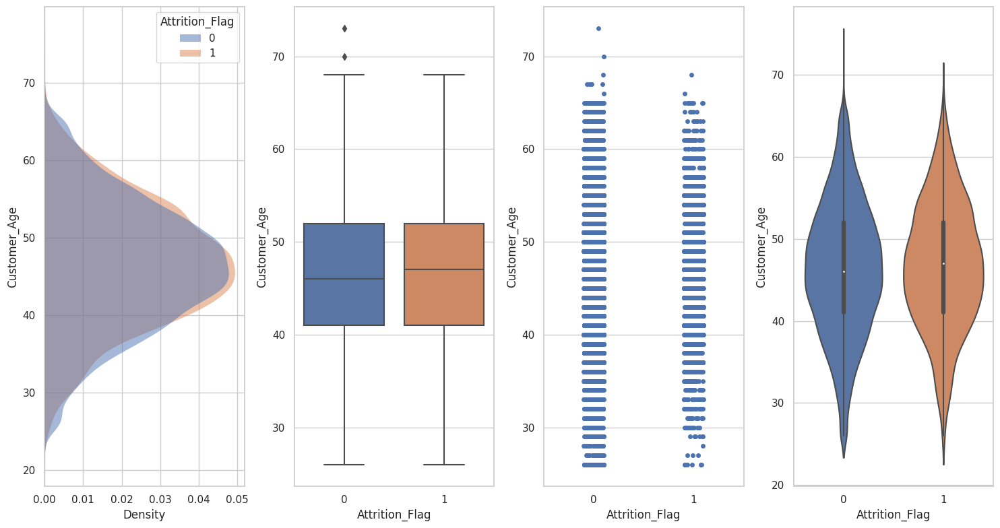

*********************************************
Dependent_count vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF        MS         F     p-unc       np2
0  Attrition_Flag      6.161297      1  6.161297  3.652825  0.056002  0.000361
1          Within  17078.050217  10125  1.686721       NaN       NaN       NaN
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1         H     p-unc
Kruskal  Attrition_Flag      1  4.458477  0.034728


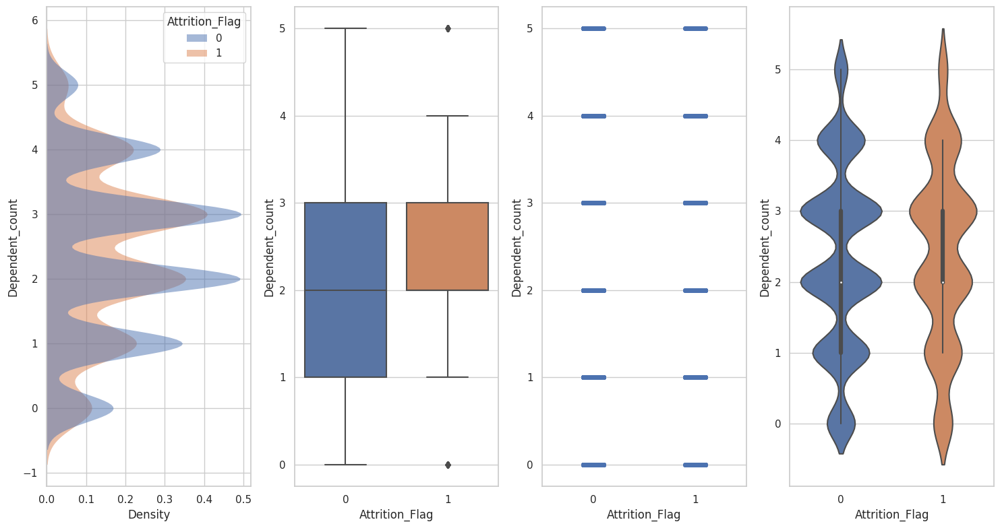

*********************************************
Months_on_book vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source             SS     DF          MS         F     p-unc  \
0  Attrition_Flag     120.989841      1  120.989841  1.897071  0.168437   
1          Within  645744.106831  10125   63.777196       NaN       NaN   

        np2  
0  0.000187  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1         H     p-unc
Kruskal  Attrition_Flag      1  2.370265  0.123666


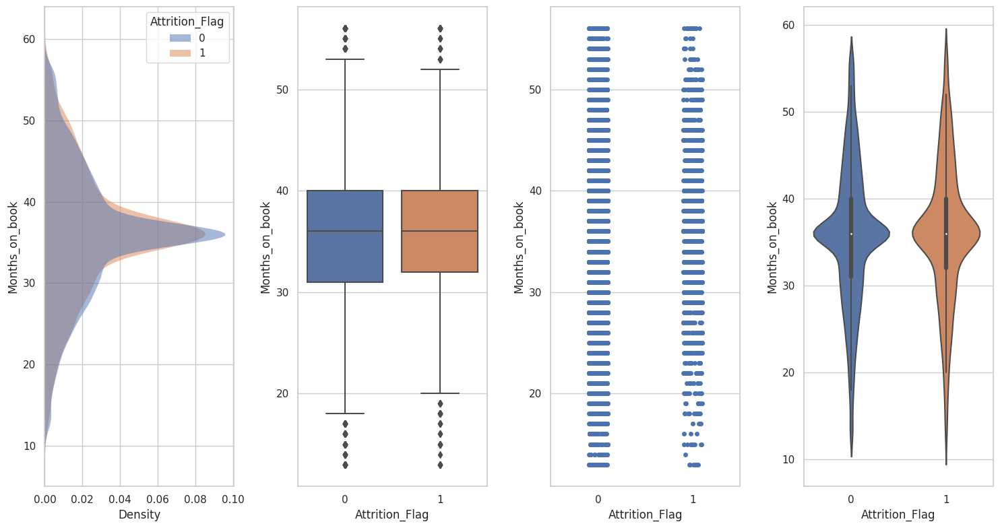

*********************************************
Total_Relationship_Count vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF          MS           F         p-unc  \
0  Attrition_Flag    550.529612      1  550.529612  233.072886  4.829281e-52   
1          Within  23915.747666  10125    2.362049         NaN           NaN   

        np2  
0  0.022502  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H         p-unc
Kruskal  Attrition_Flag      1  226.845887  2.905510e-51


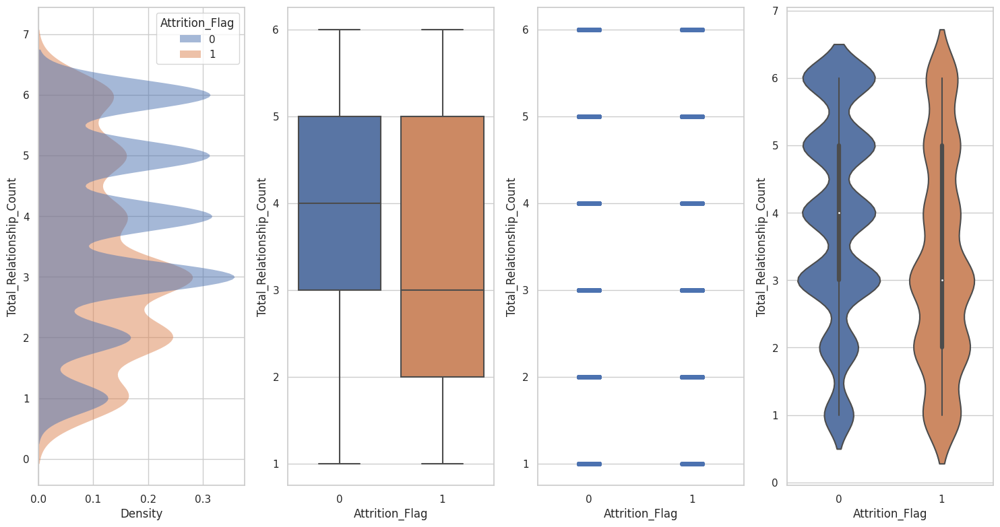

*********************************************
Months_Inactive_12_mon vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF          MS           F         p-unc  \
0  Attrition_Flag    240.360899      1  240.360899  240.910376  1.032664e-53   
1          Within  10101.906505  10125    0.997719         NaN           NaN   

        np2  
0  0.023241  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H         p-unc
Kruskal  Attrition_Flag      1  299.006549  5.422657e-67


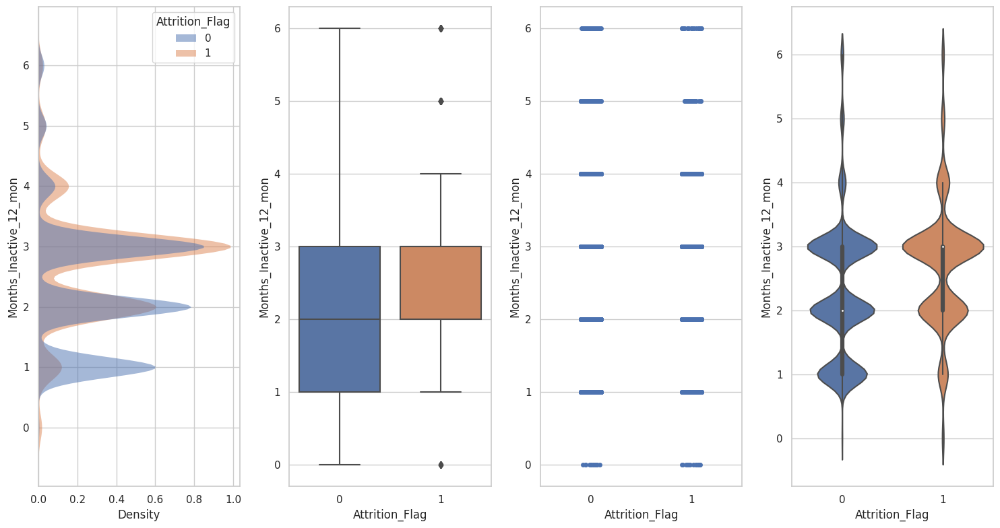

*********************************************
Contacts_Count_12_mon vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF          MS          F         p-unc  \
0  Attrition_Flag    518.168835      1  518.168835  441.86805  4.697490e-96   
1          Within  11873.362319  10125    1.172678        NaN           NaN   

        np2  
0  0.041816  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H         p-unc
Kruskal  Attrition_Flag      1  361.855162  1.110787e-80


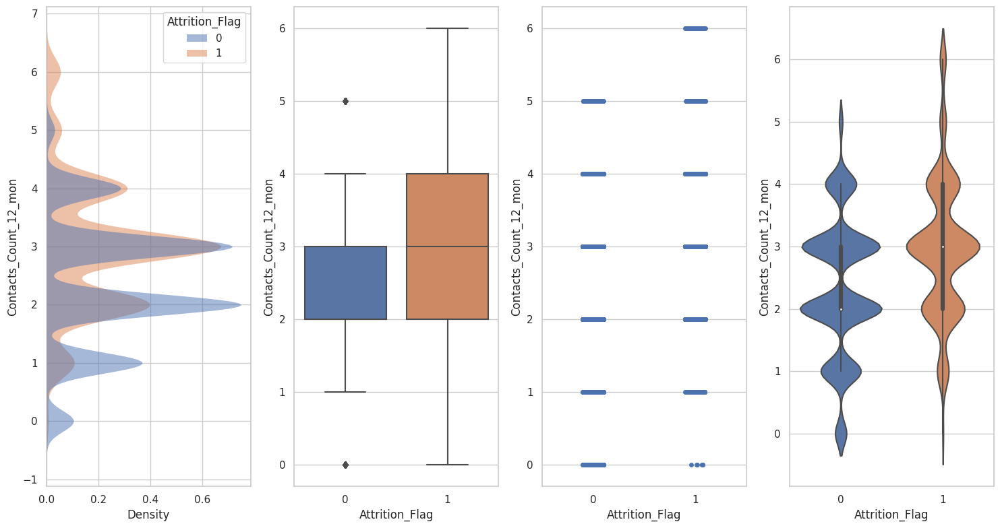

*********************************************
Credit_Limit vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF            MS         F     p-unc  \
0  Attrition_Flag  4.767191e+08      1  4.767191e+08  5.773729  0.016285   
1          Within  8.359902e+11  10125  8.256694e+07       NaN       NaN   

       np2  
0  0.00057  
1      NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1          H         p-unc
Kruskal  Attrition_Flag      1  26.244716  3.007767e-07


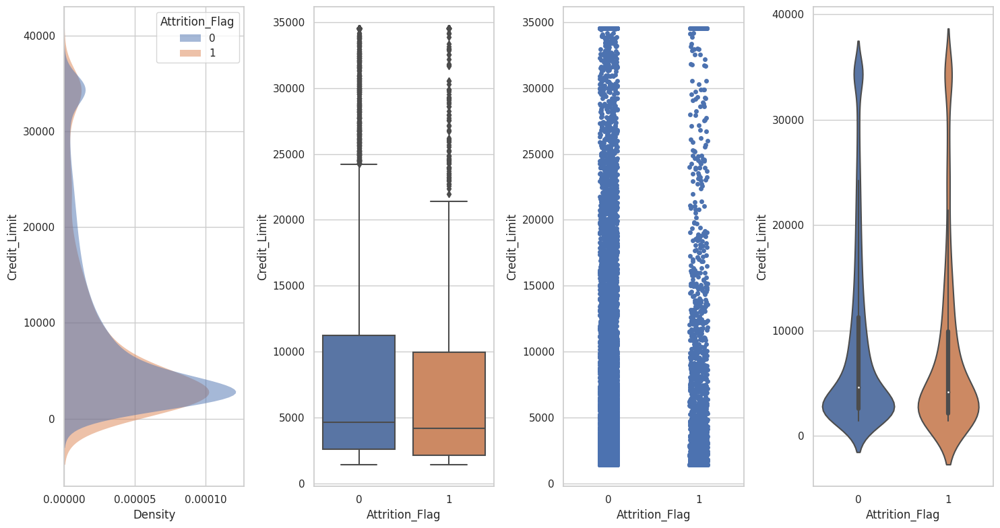

*********************************************
Total_Revolving_Bal vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF            MS           F  \
0  Attrition_Flag  4.653994e+08      1  4.653994e+08  752.702408   
1          Within  6.260334e+09  10125  6.183046e+05         NaN   

           p-unc       np2  
0  6.630148e-160  0.069197  
1            NaN       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H          p-unc
Kruskal  Attrition_Flag      1  585.938839  1.915462e-129


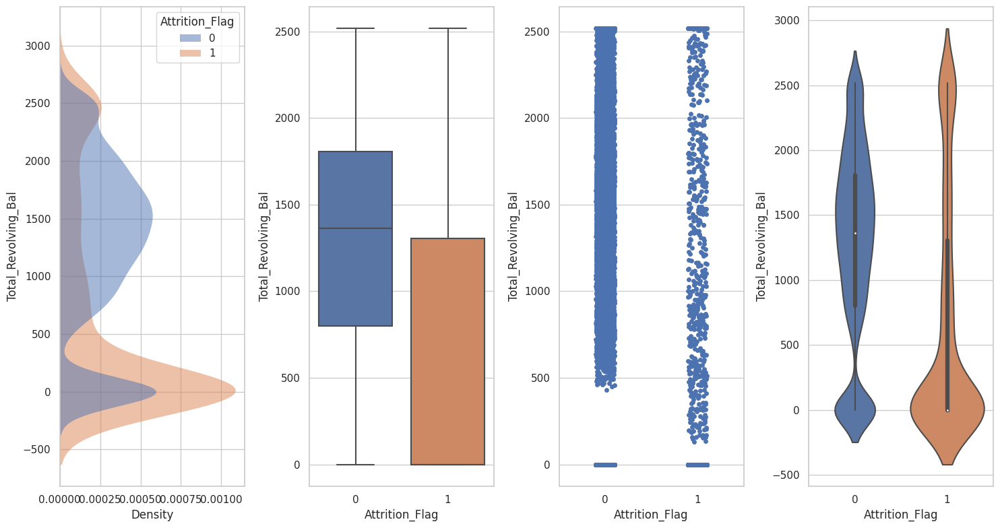

*********************************************
Avg_Open_To_Buy vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF            MS         F     p-unc  \
0  Attrition_Flag  6.800754e+04      1  6.800754e+04  0.000823  0.977116   
1          Within  8.368182e+11  10125  8.264871e+07       NaN       NaN   

            np2  
0  8.126918e-08  
1           NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1         H     p-unc
Kruskal  Attrition_Flag      1  7.657945  0.005652


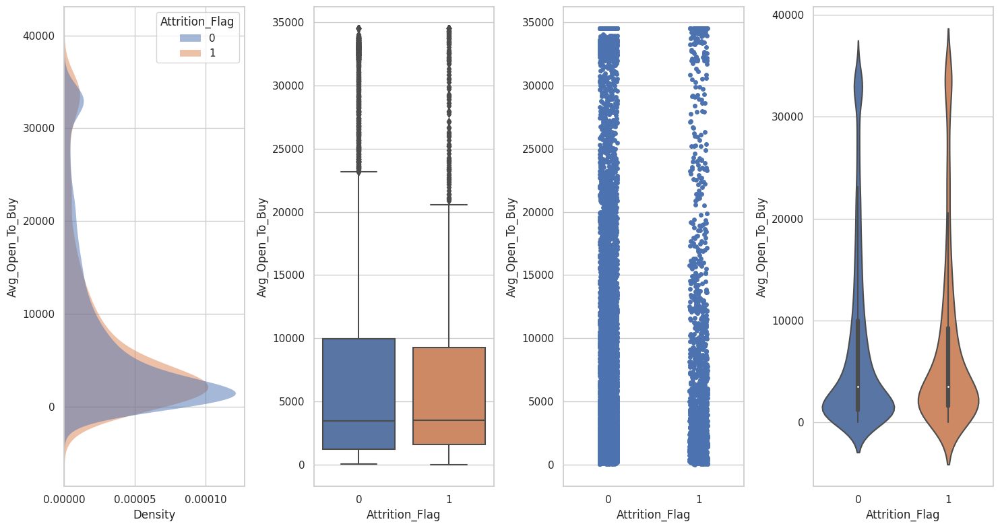

*********************************************
Total_Amt_Chng_Q4_Q1 vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source          SS     DF        MS           F         p-unc  \
0  Attrition_Flag    8.358052      1  8.358052  176.961638  4.836643e-40   
1          Within  478.212528  10125  0.047231         NaN           NaN   

        np2  
0  0.017177  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H         p-unc
Kruskal  Attrition_Flag      1  105.272516  1.064423e-24


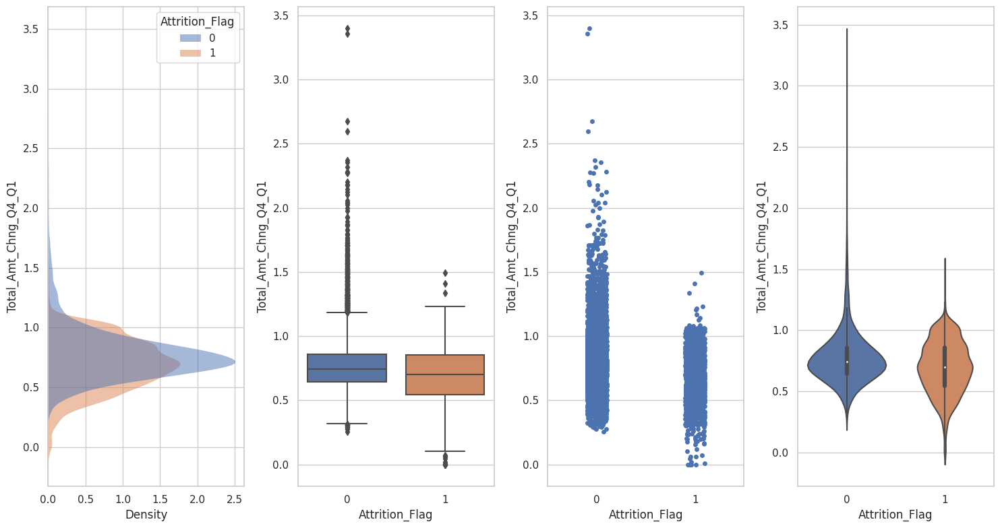

*********************************************
Total_Trans_Amt vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF            MS           F  \
0  Attrition_Flag  3.321765e+09      1  3.321765e+09  296.227714   
1          Within  1.135372e+11  10125  1.121355e+07         NaN   

          p-unc       np2  
0  1.857439e-65  0.028425  
1           NaN       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1          H          p-unc
Kruskal  Attrition_Flag      1  507.09453  2.718725e-112


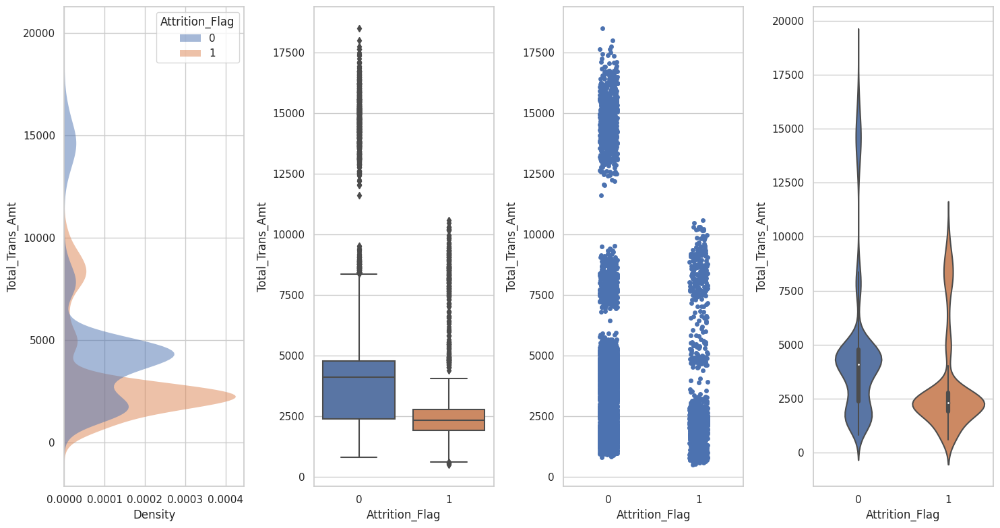

*********************************************
Total_Trans_Ct vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source            SS     DF             MS            F  p-unc  \
0  Attrition_Flag  7.695721e+05      1  769572.147906  1620.121692    0.0   
1          Within  4.809465e+06  10125     475.008854          NaN    NaN   

       np2  
0  0.13794  
1      NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H  p-unc
Kruskal  Attrition_Flag      1  1432.45047    0.0


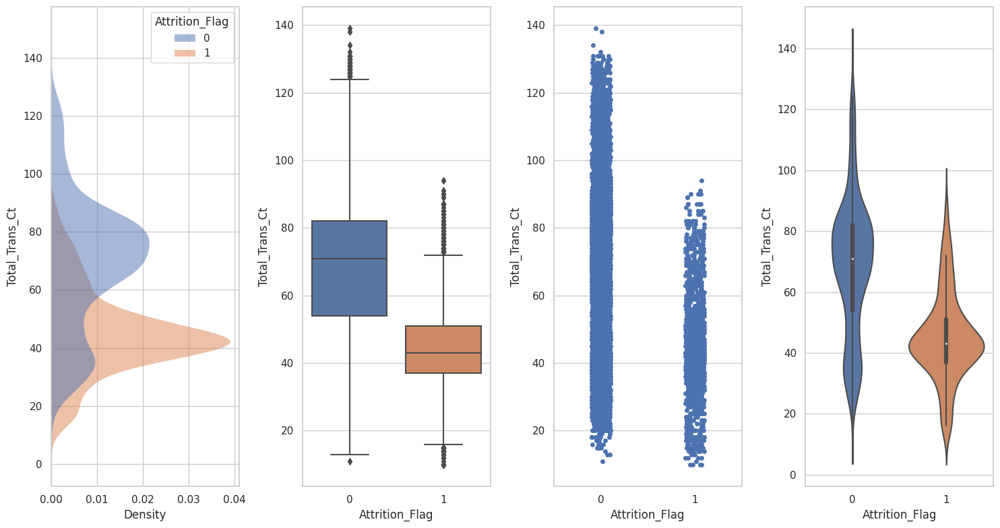

*********************************************
Total_Ct_Chng_Q4_Q1 vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source          SS     DF         MS           F          p-unc  \
0  Attrition_Flag   48.290724      1  48.290724  930.078416  1.647725e-195   
1          Within  525.701454  10125   0.051921         NaN            NaN   

        np2  
0  0.084131  
1       NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H          p-unc
Kruskal  Attrition_Flag      1  986.077347  1.907963e-216


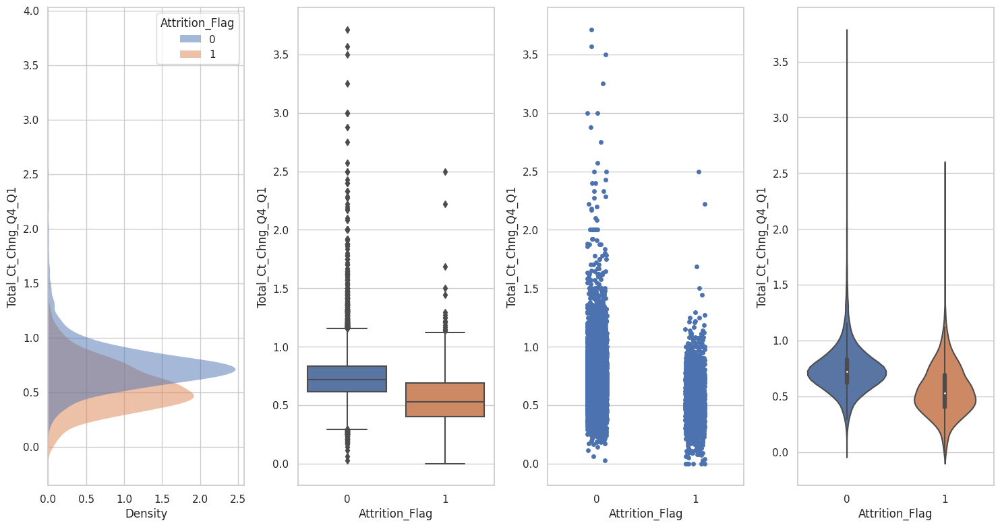

*********************************************
Avg_Utilization_Ratio vs grupos de Attrition_Flag
*********************************************
______
ANOVA
⎺⎺⎺⎺⎺⎺
           Source          SS     DF         MS           F         p-unc  \
0  Attrition_Flag   24.497659      1  24.497659  332.876795  3.357689e-73   
1          Within  745.136933  10125   0.073594         NaN           NaN   

       np2  
0  0.03183  
1      NaN  
_________________
KRUSKALL WALLIS
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 Source  ddof1           H          p-unc
Kruskal  Attrition_Flag      1  585.132361  2.868773e-129


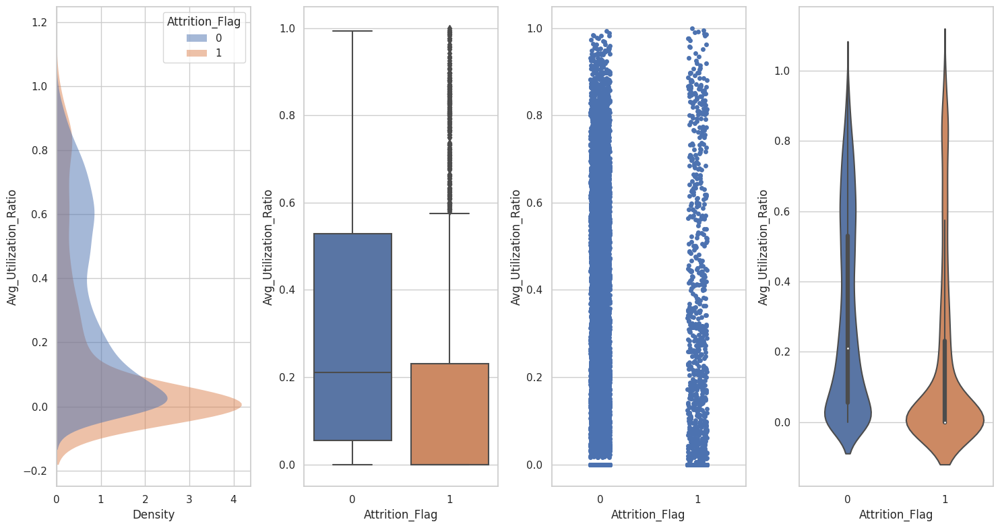

,Variable,ANOVA p-value,Kruskall Wallis p-value
11,Total_Trans_Ct,0.000000e+00,0.000000e+00
12,Total_Ct_Chng_Q4_Q1,1.647725e-195,1.907963e-216
7,Total_Revolving_Bal,6.630148e-160,1.915462e-129
5,Contacts_Count_12_mon,4.697490e-96,1.110787e-80
13,Avg_Utilization_Ratio,3.357689e-73,2.868773e-129
10,Total_Trans_Amt,1.857439e-65,2.718725e-112
4,Months_Inactive_12_mon,1.032664e-53,5.422657e-67
3,Total_Relationship_Count,4.829281e-52,2.905510e-51
9,Total_Amt_Chng_Q4_Q1,4.836643e-40,1.064423e-24
6,Credit_Limit,1.628536e-02,3.007767e-07


In [108]:
# Cálculo de la ANOVA y Kruskall Wallis:

var_y = 'Attrition_Flag' # variable cualitativa fija (respuesta)
vec_var_num =  ['Customer_Age',
                'Dependent_count',
                'Months_on_book',
                'Total_Relationship_Count',
                'Months_Inactive_12_mon',
                'Contacts_Count_12_mon',
                'Credit_Limit',
                'Total_Revolving_Bal',
                'Avg_Open_To_Buy',
                'Total_Amt_Chng_Q4_Q1',
                'Total_Trans_Amt',
                'Total_Trans_Ct',
                'Total_Ct_Chng_Q4_Q1',
                'Avg_Utilization_Ratio'] # vector de los nomnbres de las variables cuantitativas de entrada

anova_df = pd.DataFrame(columns=['Variable', 'ANOVA p-value', 'Kruskall Wallis p-value'])

for i in vec_var_num:
    
    print("*********************************************")
    print(i + " vs grupos de " + var_y)
    print("*********************************************")
    print("______")
    print("ANOVA")
    print("⎺⎺⎺⎺⎺⎺")
    # Calcular la ANOVA para i vs var_y
    aov = pg.anova(dv=i, between=var_y, data=data,
                   detailed=True)
    print(aov)
    print("_________________")
    print("KRUSKALL WALLIS")
    print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")    
    # Calcular Kruskall Wallis para i vs var_y
    kruskal = pg.kruskal(dv=i, between=var_y, data=data)
    print(kruskal)
    
    # Copiamos los p-valores que calculamos en el data frame:
    anova_df.loc[len(anova_df)]=[i,aov['p-unc'][0],kruskal['p-unc'][0]]
    
    
    # Gráfico de comparación de medias:
    y = var_y
    x = i
    
    fig, axs = plt.subplots(ncols=4, figsize=(15, 8))
    sns.kdeplot(
        data=data, y=x, hue=y,
        fill=True, common_norm=False,
        alpha=.5, linewidth=0, ax=axs[0])
    sns.boxplot(data=data, y=x, x=y,ax=axs[1])
    sns.stripplot(y= x,data=data, x =y,ax=axs[2])
    sns.violinplot(data=data, y=x, x=y,ax=axs[3])
    fig.tight_layout()
    plt.show()

# ordenar el data frame de menos a mayor p-value:

anova_df = anova_df.sort_values(by='ANOVA p-value')
anova_df

En todos las variables existe significación tanto en ANOVA como en Kruskall Wallis. La menos evidente es con el Avg_Open_To_Buy y la más evidente es con Total_Trans_Ct

## Attrition_Flag vs las variables cualitativas

**************************************
Gender vs Attrition_Flag
**************************************
_________________
Valores esperados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag            0           1
Gender                                 
F               4497.185741  860.814259
M               4002.814259  766.185741
_________________
Valores observados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag       0      1
Gender                       
F               4428.5  929.5
M               4071.5  697.5
_________________
Chi cuadrado:
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 test    lambda       chi2  dof      pval    cramer     power
0             pearson  1.000000  13.865614  1.0  0.000196  0.037002  0.961108
1        cressie-read  0.666667  13.881072  1.0  0.000195  0.037023  0.961283
2      log-likelihood  0.000000  13.916812  1.0  0.000191  0.037071  0.961683
3       freeman-tukey -0.500000  13.947875  1.0  0.000188  0.037112  0.962028
4  mod-log-likelihood -1.000000  13.982629  1.0  0.000185  0.0371

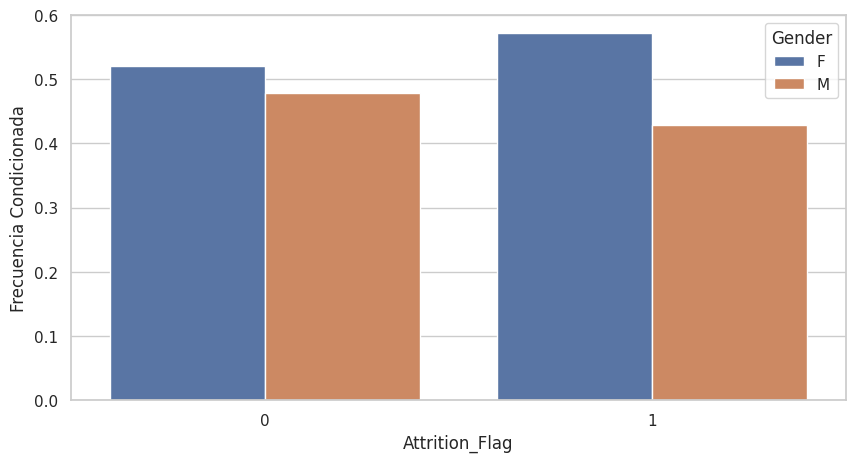

**************************************
Education_Level vs Attrition_Flag
**************************************
_________________
Valores esperados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag             0           1
Education_Level                         
College           850.251802  162.748198
Doctorate         378.542510   72.457490
Graduate         2625.456700  502.543300
High School      1689.592179  323.407821
Post-Graduate     433.099635   82.900365
Uneducated       1248.099141  238.900859
Unknown          1274.958033  244.041967
_________________
Valores observados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag      0    1
Education_Level           
College           859  154
Doctorate         356   95
Graduate         2641  487
High School      1707  306
Post-Graduate     424   92
Uneducated       1250  237
Unknown          1263  256
_________________
Chi cuadrado:
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 test    lambda       chi2  dof      pval    cramer     power
0             pearson  1.000000  12.

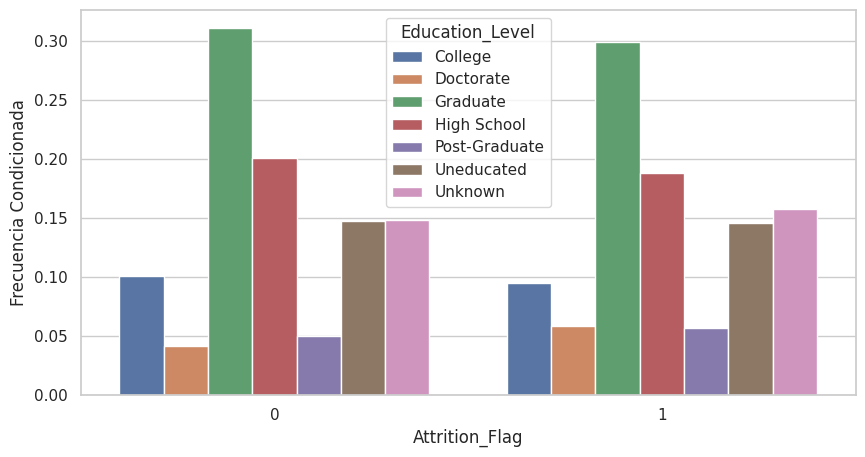

**************************************
Marital_Status vs Attrition_Flag
**************************************
_________________
Valores esperados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag            0           1
Marital_Status                         
Divorced         627.826602  120.173398
Married         3933.988348  753.011652
Single          3309.519107  633.480893
Unknown          628.665943  120.334057
_________________
Valores observados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag     0    1
Marital_Status           
Divorced         627  121
Married         3978  709
Single          3275  668
Unknown          620  129
_________________
Chi cuadrado:
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 test    lambda      chi2  dof      pval    cramer     power
0             pearson  1.000000  6.056097  3.0  0.108913  0.024454  0.522262
1        cressie-read  0.666667  6.057061  3.0  0.108867  0.024456  0.522334
2      log-likelihood  0.000000  6.059976  3.0  0.108728  0.024462  0.522551
3       freeman-tukey -

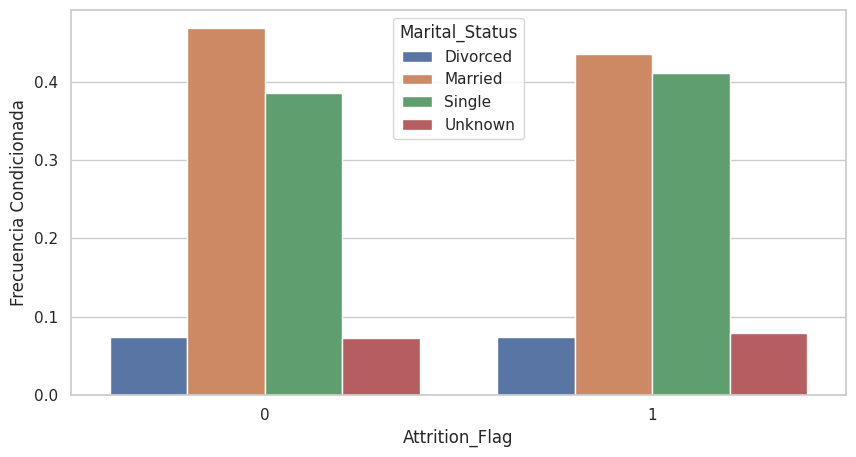

**************************************
Income_Category vs Attrition_Flag
**************************************
_________________
Valores esperados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag             0           1
Income_Category                         
$120K +           610.200454  116.799546
$40K - $60K      1502.419275  287.580725
$60K - $80K      1176.755209  225.244791
$80K - $120K     1288.387479  246.612521
Less than $40K   2988.891083  572.108917
Unknown           933.346499  178.653501
_________________
Valores observados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag      0    1
Income_Category           
$120K +           601  126
$40K - $60K      1519  271
$60K - $80K      1213  189
$80K - $120K     1293  242
Less than $40K   2949  612
Unknown           925  187
_________________
Chi cuadrado:
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 test    lambda       chi2  dof      pval    cramer     power
0             pearson  1.000000  12.832259  5.0  0.025002  0.035597  0.800167
1        cressie-read  0.6

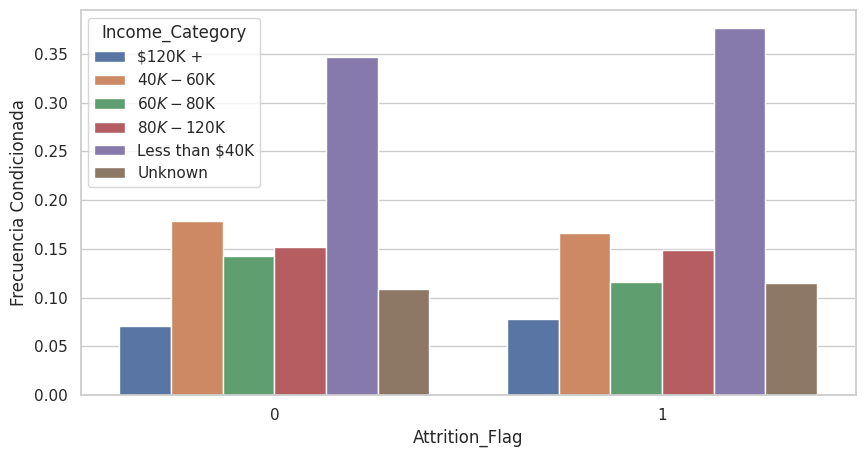

**************************************
Card_Category vs Attrition_Flag
**************************************
_________________
Valores esperados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag            0            1
Card_Category                           
Blue            7920.015799  1515.984201
Gold              97.363484    18.636516
Platinum          16.786808     3.213192
Silver           465.833909    89.166091
_________________
Valores observados
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
Attrition_Flag     0     1
Card_Category             
Blue            7917  1519
Gold              95    21
Platinum          15     5
Silver           473    82
_________________
Chi cuadrado:
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺
                 test    lambda      chi2  dof      pval    cramer     power
0             pearson  1.000000  2.234227  3.0  0.525238  0.014853  0.211190
1        cressie-read  0.666667  2.185475  3.0  0.534815  0.014690  0.207223
2      log-likelihood  0.000000  2.099918  3.0  0.551929  0.014400  0.200288
3       free

/home/mauro/Mis_proyectos_jupyter/Proyects/Codigos/abandono_cliente/lib/python3.10/site-packages/pingouin/contingency.py:150: UserWarning: Low count on expected frequencies.
  warnings.warn("Low count on {} frequencies.".format(name))


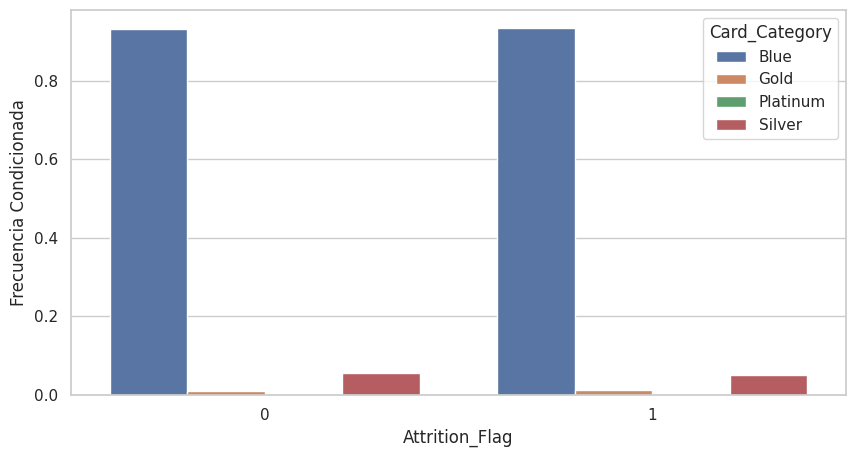

_______________________________________________
Resumen de todos los test de chi cuadrado:
⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺


,Variable,Chi2 Pearson p-value,Chi 2 log-likelihood p-value
0,Gender,0.000196,0.000191
3,Income_Category,0.025002,0.022486
1,Education_Level,0.051489,0.064362
2,Marital_Status,0.108913,0.108728
4,Card_Category,0.525238,0.551929


In [109]:
# Diagramas de barras de dos factores de frecuencias condicionadas a los grupos de la variable x

x = 'Attrition_Flag' # variable de salida (Attrition_Flag)
# definir el vector de las variables cualitativas de entrada
vec_y = ['Gender', 
         'Education_Level',
         'Marital_Status', 
         'Income_Category',
         'Card_Category'
         ]


chi2_df = pd.DataFrame(columns=['Variable', 'Chi2 Pearson p-value', 'Chi 2 log-likelihood p-value'])


for i in vec_y:

    y = i
    print('**************************************')
    print(y + ' vs ' + x)
    print('**************************************')
    
    # Chi Cuadrado:
    chi2_res = pg.chi2_independence(data, x=y,y=x)
    print("_________________")
    print("Valores esperados")
    print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")
    print(chi2_res[0])
    print("_________________")
    print("Valores observados")
    print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")
    print(chi2_res[1])
    print("_________________")
    print("Chi cuadrado:")
    print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")
    print(chi2_res[2])
    print("_________________________")
    print("Frecuencias condicionadas:")
    print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")
    # Tabla de frecuencias condicionadas:
    pct2 = (data.groupby([x,y]).size() / data.groupby([x]).size()).reset_index().rename({0:'Frecuencia Condicionada'}, axis=1)
    print(pct2)
    print("_________________")
    print("Diagrama barras:")
    print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")
    # Gráfico de barras de las frecuencias condicionadas:
    sns.barplot(x=x, hue=y, y='Frecuencia Condicionada', data=pct2)
    plt.show()
    
    # Guardamos los valores de chi cuadrado:
    # Copiamos los p-valores que calculamos en el data frame:
    chi2_df.loc[len(chi2_df)]=[i,chi2_res[2]["pval"][0],chi2_res[2]["pval"][2]]

    
print("_______________________________________________")
print("Resumen de todos los test de chi cuadrado:")
print("⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺⎺")
# ordenar el data frame de menos a mayor p-value:
chi2_df = chi2_df.sort_values(by='Chi2 Pearson p-value')
chi2_df

Las únicas variables que no son significativas son Marital_Status y Card_Category. Estas dos las podríamos quitar del algoritmo ya que no encontramos ningún patrón.

Las demás si que presentan patrones o algo que decir con las variable Attrition_Flag.

En este caso sería bueno hablar con un experto en el tema para corroborar que los patrones encontrados tienen sentido.

Gender e Income_Category son las dos variables con más importancia dentro del Attrition_Flag. Estos dos variables tendrían que estar en cualquier algoritmo o modelo que calcularemos.

¡Vamos a ver que nos sale!

# Modelo estadístico para un problema de clasificación - regresión logística

Como hemos comentado anteriormente, utilizaremos la variable Attrition_Flag para entrenar un algoritmo capaz de clasificar los clientes en dos grupos (si son clientes activos o no).

Hasta ahora hemos comparado y relacionado con test estadísticos por parejas pero no hemos mirado el problema de forma global.

Para ello vamos a calcular un modelo de regresión logístico teniendo como respuesta una variable binaria (Attrition_Flag).

Durante este punto vas a ver tres maneras para seleccionar las variables (feature selection) en modelos estadísticos etadísticos:

- Selección manual de variables
- Stepwise selection
- Mejor modelo según el BIC

En este ejemplo vamos a optar por usar la selección manual para entender el feeling del modelo logístico.

Y vamos a hacerlo dos veces:
- Sin balancear los datos
- Balanceando los datos

Tenemos un problema altamente desbalanceado con alrededor de 8500 clientes activos y 1627 perdidos, será un tema muy importante en el proyecto.

## NO BALANCEADO - Modelo logístico con selección de variables manual

Uno de los temas más importantes es el feature selection en los modelos estadísticos.

Es decir, qué variables son las representativas e importantes en el sistema que estamos modelando.

Ahora lo que vamos a hacer es seleccionar las variables de forma manual como vas a ver a continuación.

La idea aquí, es ir quitando aquellas variables que no son significativas, es decir, con p-valores altos:

En resumen, si el p-valor es menor que el umbral de significancia (generalmente 0.05), se puede concluir que la variable está relacionada de manera significativa con la variable de resultado. Si el p-valor es mayor que el umbral de significancia, no se puede concluir que la variable está relacionada de manera significativa con la variable de resultado.

In [110]:
# NO BALANCEADO TEST 1
 
# Quitaremos Marital_Status Card_Category ya que no es significativo y ver el efecto de :


# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         'Credit_Limit',
         'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         'Avg_Utilization_Ratio'
         ]

X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = ['Gender',
                'Education_Level',
                'Income_Category'
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ['Income_Category_Unknown',
              'Income_Category_$120K +',
              'Education_Level_Unknown'
              #'',
              #''
              #'',
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

         Current function value: 0.236550
         Iterations: 35


/home/mauro/Mis_proyectos_jupyter/Proyects/Codigos/abandono_cliente/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10103
Method:                           MLE   Df Model:                           23
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4633
Time:                        10:37:30   Log-Likelihood:                -2395.5
converged:                      False   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                              3.6031        nan        nan        nan         nan         nan
Dependent_count                    0.1388      0.030      4.703      0.000       0.081       0.197
Months_on_book                    -0.0104      0.005     -2.246      0.025      -0.020      -0.001
Total_Relationship_Count          -0.4530      0.027    -16.601      0.000      -0.506      -0.399
Months_Inactive_12_mon             0.5047      0.038     13.444      0.000       0.431       0.578
Contacts_Count_12_mon              0.5009      0.036     13.910      0.000       0.430       0.571
Credit_Limit                   -2.419e-06   5.71e-06     -0.424      0.672   -1.36e-05    8.77e-06
Total_Revolving_Bal               -0.0010   7.14e-05    -13.366      0.000      -0.001      -0.001
Total_Amt_Chng_Q4_Q1              -0.4517      0.185     -2.448      0.014      -0.813      -0.090
Total_Trans_Amt                    0.0005   2.25e-05     21.054      0.000       0.000       0.001
Total_Trans_Ct                    -0.1148      0.004    -31.653      0.000      -0.122      -0.108
Total_Ct_Chng_Q4_Q1               -2.8152      0.187    -15.044      0.000      -3.182      -2.448
Avg_Utilization_Ratio             -0.0958      0.244     -0.392      0.695      -0.575       0.383
Gender_F                           2.1135        nan        nan        nan         nan         nan
Gender_M                           1.4896        nan        nan        nan         nan         nan
Education_Level_College           -0.1334      0.154     -0.867      0.386      -0.435       0.168
Education_Level_Doctorate          0.1930      0.193      1.001      0.317      -0.185       0.571
Education_Level_Graduate          -0.1587      0.117     -1.358      0.175      -0.388       0.070
Education_Level_High School       -0.1445      0.128     -1.131      0.258      -0.395       0.106
Education_Level_Post-Graduate      0.1493      0.189      0.791      0.429      -0.221       0.519
Education_Level_Uneducated        -0.0810      0.137     -0.589      0.556      -0.350       0.188
Income_Category_$40K - $60K       -0.2760      0.133     -2.068      0.039      -0.538      -0.014
Income_Category_$60K - $80K       -0.2329      0.153     -1.520      0.128      -0.533       0.067
Income_Category_$80K - $120K       0.0111      0.144      0.078      0.938      -0.270       0.293
Income_Category_Less than $40K    -0.0392      0.121     -0.323      0.746      -0.276       0.198
==================================================================================================
"""

In [111]:
# NO BALANCEADO TEST 2

# Quitaremos ya que no es significativo y ver el efecto de :


# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         'Credit_Limit',
         'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         'Avg_Utilization_Ratio'
         ]
X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = ['Gender',
                'Education_Level',
                'Income_Category'
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = ['Income_Category_Unknown',
              'Income_Category_$120K +',
              'Education_Level_Unknown',
              'Education_Level_Post-Graduate',
              'Education_Level_Doctorate'
              #'',
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()


         Current function value: 0.236615
         Iterations: 35


/home/mauro/Mis_proyectos_jupyter/Proyects/Codigos/abandono_cliente/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10105
Method:                           MLE   Df Model:                           21
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4632
Time:                        10:37:31   Log-Likelihood:                -2396.2
converged:                      False   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                              3.6519        nan        nan        nan         nan         nan
Dependent_count                    0.1381      0.029      4.681      0.000       0.080       0.196
Months_on_book                    -0.0104      0.005     -2.241      0.025      -0.019      -0.001
Total_Relationship_Count          -0.4533      0.027    -16.613      0.000      -0.507      -0.400
Months_Inactive_12_mon             0.5044      0.038     13.442      0.000       0.431       0.578
Contacts_Count_12_mon              0.5004      0.036     13.898      0.000       0.430       0.571
Credit_Limit                   -2.411e-06    5.7e-06     -0.423      0.673   -1.36e-05    8.77e-06
Total_Revolving_Bal               -0.0010   7.14e-05    -13.372      0.000      -0.001      -0.001
Total_Amt_Chng_Q4_Q1              -0.4510      0.184     -2.445      0.014      -0.812      -0.089
Total_Trans_Amt                    0.0005   2.25e-05     21.051      0.000       0.000       0.001
Total_Trans_Ct                    -0.1148      0.004    -31.653      0.000      -0.122      -0.108
Total_Ct_Chng_Q4_Q1               -2.8176      0.187    -15.061      0.000      -3.184      -2.451
Avg_Utilization_Ratio             -0.0966      0.244     -0.395      0.693      -0.575       0.382
Gender_F                           2.1392        nan        nan        nan         nan         nan
Gender_M                           1.5127        nan        nan        nan         nan         nan
Education_Level_College           -0.2010      0.141     -1.422      0.155      -0.478       0.076
Education_Level_Graduate          -0.2262      0.100     -2.262      0.024      -0.422      -0.030
Education_Level_High School       -0.2121      0.112     -1.886      0.059      -0.433       0.008
Education_Level_Uneducated        -0.1485      0.123     -1.203      0.229      -0.390       0.093
Income_Category_$40K - $60K       -0.2759      0.133     -2.071      0.038      -0.537      -0.015
Income_Category_$60K - $80K       -0.2322      0.153     -1.516      0.129      -0.532       0.068
Income_Category_$80K - $120K       0.0124      0.144      0.087      0.931      -0.269       0.294
Income_Category_Less than $40K    -0.0410      0.121     -0.339      0.735      -0.278       0.196
==================================================================================================
"""

In [112]:
#Ahora vamos a convertir la variable Gender en binaria 
#Reemplazamos los valores "Existing Customer" (Cliente Existente) con 0 y "Attrited Customer"	(Cliente Perdido) con 1
data['Gender'] = data['Gender'].replace({'F': 0, 'M': 1})

In [113]:
# Convertiremos la variable Income_Category a ordinal ya que el modelo no converge correctamente añadiendo :
#Income_Category           
#$120K +           
#$40K - $60K      
#$60K - $80K      
#$80K - $120K     
#Less than $40K   
#Unknown    

data['Income_Category'].loc[data['Income_Category']=='Unknown']=0
data['Income_Category'].loc[data['Income_Category']=='Less than $40K']=1
data['Income_Category'].loc[data['Income_Category']=='$40K - $60K']=2
data['Income_Category'].loc[data['Income_Category']=='$60K - $80K']=3
data['Income_Category'].loc[data['Income_Category']=='$80K - $120K']=4
data['Income_Category'].loc[data['Income_Category']=='$120K +']=5
data['Income_Category'] = data['Income_Category'].astype('int64')

/tmp/ipykernel_25504/2452562652.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Income_Category'].loc[data['Income_Category']=='Unknown']=0
/tmp/ipykernel_25504/2452562652.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Income_Category'].loc[data['Income_Category']=='Less than $40K']=1
/tmp/ipykernel_25504/2452562652.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Income_Category'].loc[data['Income_Cate

In [114]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,1,3,High School,Married,3,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,0,5,Graduate,Single,1,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,1,3,Graduate,Married,4,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,0,4,High School,Unknown,1,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,1,3,Uneducated,Married,3,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [115]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  int64  
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [116]:
# NO BALANCEADO TEST 3

# Añadimos como nueva variable ordinal:


# Seleccionamos las variable de entrada y salida:
# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         'Credit_Limit',
         'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         'Avg_Utilization_Ratio'
         ]
X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              'Education_Level_Unknown',
              'Education_Level_Post-Graduate',
              'Education_Level_Doctorate'
              #'',
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.236574
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10108
Method:                           MLE   Df Model:                           18
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4633
Time:                        10:37:31   Log-Likelihood:                -2395.8
converged:                       True   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           5.5988      0.336     16.679      0.000       4.941       6.257
Gender                         -0.9601      0.127     -7.588      0.000      -1.208      -0.712
Income_Category                 0.1292      0.043      2.976      0.003       0.044       0.214
Dependent_count                 0.1292      0.030      4.370      0.000       0.071       0.187
Months_on_book                 -0.0110      0.005     -2.351      0.019      -0.020      -0.002
Total_Relationship_Count       -0.4536      0.027    -16.614      0.000      -0.507      -0.400
Months_Inactive_12_mon          0.5076      0.038     13.534      0.000       0.434       0.581
Contacts_Count_12_mon           0.5035      0.036     13.937      0.000       0.433       0.574
Credit_Limit                 -2.66e-06   5.55e-06     -0.479      0.632   -1.35e-05    8.22e-06
Total_Revolving_Bal            -0.0010   7.11e-05    -13.448      0.000      -0.001      -0.001
Total_Amt_Chng_Q4_Q1           -0.4437      0.184     -2.406      0.016      -0.805      -0.082
Total_Trans_Amt                 0.0005   2.24e-05     21.077      0.000       0.000       0.001
Total_Trans_Ct                 -0.1146      0.004    -31.658      0.000      -0.122      -0.107
Total_Ct_Chng_Q4_Q1            -2.8170      0.187    -15.054      0.000      -3.184      -2.450
Avg_Utilization_Ratio          -0.0893      0.243     -0.368      0.713      -0.565       0.386
Education_Level_College        -0.2019      0.141     -1.432      0.152      -0.478       0.074
Education_Level_Graduate       -0.2240      0.100     -2.239      0.025      -0.420      -0.028
Education_Level_High School    -0.2165      0.112     -1.926      0.054      -0.437       0.004
Education_Level_Uneducated     -0.1463      0.123     -1.185      0.236      -0.388       0.096
===============================================================================================
"""

Ahora nos converge y por ello podemos empezar a analizar qué pasa.

Quitaremos Avg_Utilization_Ratio



In [117]:
#Haremos una técnica de escalado para algunas variables y ver el comportamiento del modelo
# Crear un objeto escalador para la variable Credit_Limit
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Escalar la variable "Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt"
data['Credit_Limit'] = scaler.fit_transform(data[['Credit_Limit']])
data['Total_Revolving_Bal'] = scaler.fit_transform(data[['Total_Revolving_Bal']])
data['Avg_Open_To_Buy'] = scaler.fit_transform(data[['Avg_Open_To_Buy']])
data['Total_Trans_Amt'] = scaler.fit_transform(data[['Total_Trans_Amt']])

# Mostrar el dataframe resultante
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,1,3,High School,Married,3,Blue,39,5,1,3,0.340190,0.308701,0.345116,1.335,0.035273,42,1.625,0.061
1,0,49,0,5,Graduate,Single,1,Blue,44,6,1,2,0.206112,0.343266,0.214093,1.541,0.043452,33,3.714,0.105
2,0,51,1,3,Graduate,Married,4,Blue,36,4,1,0,0.059850,0.000000,0.098948,2.594,0.076611,20,2.333,0.000
3,0,40,0,4,High School,Unknown,1,Blue,34,3,4,1,0.056676,1.000000,0.022977,1.405,0.036775,20,2.333,0.760
4,0,40,1,3,Uneducated,Married,3,Blue,21,5,1,0,0.099091,0.000000,0.136557,2.175,0.017025,28,2.500,0.000


In [118]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,1,3,High School,Married,3,Blue,39,5,1,3,0.340190,0.308701,0.345116,1.335,0.035273,42,1.625,0.061
1,0,49,0,5,Graduate,Single,1,Blue,44,6,1,2,0.206112,0.343266,0.214093,1.541,0.043452,33,3.714,0.105
2,0,51,1,3,Graduate,Married,4,Blue,36,4,1,0,0.059850,0.000000,0.098948,2.594,0.076611,20,2.333,0.000
3,0,40,0,4,High School,Unknown,1,Blue,34,3,4,1,0.056676,1.000000,0.022977,1.405,0.036775,20,2.333,0.760
4,0,40,1,3,Uneducated,Married,3,Blue,21,5,1,0,0.099091,0.000000,0.136557,2.175,0.017025,28,2.500,0.000


In [119]:
# NO BALANCEADO TEST 4

# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         'Credit_Limit',
         'Total_Revolving_Bal',
         'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]
X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              'Education_Level_Unknown',
              'Education_Level_Post-Graduate',
              'Education_Level_Doctorate',
              'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.236652
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10110
Method:                           MLE   Df Model:                           16
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4631
Time:                        10:37:31   Log-Likelihood:                -2396.6
converged:                       True   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           5.7655        nan        nan        nan         nan         nan
Gender                         -0.9559      0.126     -7.573      0.000      -1.203      -0.708
Income_Category                 0.1289      0.043      2.966      0.003       0.044       0.214
Dependent_count                 0.1291      0.030      4.372      0.000       0.071       0.187
Months_on_book                 -0.0109      0.005     -2.333      0.020      -0.020      -0.002
Total_Relationship_Count       -0.4537      0.027    -16.626      0.000      -0.507      -0.400
Months_Inactive_12_mon          0.5070      0.037     13.520      0.000       0.433       0.580
Contacts_Count_12_mon           0.5038      0.036     13.943      0.000       0.433       0.575
Credit_Limit                   -0.2372        nan        nan        nan         nan         nan
Total_Revolving_Bal            -2.4418        nan        nan        nan         nan         nan
Avg_Open_To_Buy                 0.1905        nan        nan        nan         nan         nan
Total_Amt_Chng_Q4_Q1           -0.4417      0.184     -2.397      0.017      -0.803      -0.081
Total_Trans_Amt                 8.4983      0.402     21.152      0.000       7.711       9.286
Total_Trans_Ct                 -0.1146      0.004    -31.691      0.000      -0.122      -0.108
Total_Ct_Chng_Q4_Q1            -2.8229      0.187    -15.096      0.000      -3.189      -2.456
Education_Level_College        -0.1487      0.134     -1.111      0.267      -0.411       0.114
Education_Level_Graduate       -0.1710      0.090     -1.905      0.057      -0.347       0.005
Education_Level_High School    -0.1630      0.103     -1.576      0.115      -0.366       0.040
===============================================================================================
"""

In [120]:
# NO BALANCEADO TEST 5
#No hemos tenido cambios significativos en el anterior test 

# Quitaremos Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy

# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              'Education_Level_Unknown',
              'Education_Level_Post-Graduate',
              'Education_Level_Doctorate',
              'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.261535
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10112
Method:                           MLE   Df Model:                           14
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4066
Time:                        10:37:31   Log-Likelihood:                -2648.6
converged:                       True   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           4.7925      0.311     15.435      0.000       4.184       5.401
Gender                         -0.9679      0.120     -8.064      0.000      -1.203      -0.733
Income_Category                 0.1107      0.040      2.765      0.006       0.032       0.189
Dependent_count                 0.1244      0.028      4.488      0.000       0.070       0.179
Months_on_book                 -0.0130      0.004     -2.952      0.003      -0.022      -0.004
Total_Relationship_Count       -0.4590      0.026    -17.770      0.000      -0.510      -0.408
Months_Inactive_12_mon          0.5069      0.035     14.299      0.000       0.437       0.576
Contacts_Count_12_mon           0.5100      0.034     15.034      0.000       0.444       0.576
Total_Amt_Chng_Q4_Q1           -0.4476      0.171     -2.622      0.009      -0.782      -0.113
Total_Trans_Amt                 7.8808      0.377     20.903      0.000       7.142       8.620
Total_Trans_Ct                 -0.1083      0.003    -31.902      0.000      -0.115      -0.102
Total_Ct_Chng_Q4_Q1            -2.9948      0.180    -16.671      0.000      -3.347      -2.643
Education_Level_College        -0.1384      0.126     -1.095      0.273      -0.386       0.109
Education_Level_Graduate       -0.1788      0.085     -2.104      0.035      -0.345      -0.012
Education_Level_High School    -0.1542      0.097     -1.584      0.113      -0.345       0.037
===============================================================================================
"""

In [121]:
# NO BALANCEADO TEST 6

# Quitaremos ahora Education_Level

# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         #'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                #'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.261796
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10115
Method:                           MLE   Df Model:                           11
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4060
Time:                        10:37:31   Log-Likelihood:                -2651.2
converged:                       True   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        4.6918      0.307     15.285      0.000       4.090       5.293
Gender                      -0.9671      0.120     -8.068      0.000      -1.202      -0.732
Income_Category              0.1100      0.040      2.750      0.006       0.032       0.188
Dependent_count              0.1247      0.028      4.502      0.000       0.070       0.179
Months_on_book              -0.0131      0.004     -2.974      0.003      -0.022      -0.004
Total_Relationship_Count    -0.4600      0.026    -17.825      0.000      -0.511      -0.409
Months_Inactive_12_mon       0.5060      0.035     14.282      0.000       0.437       0.575
Contacts_Count_12_mon        0.5116      0.034     15.088      0.000       0.445       0.578
Total_Amt_Chng_Q4_Q1        -0.4460      0.171     -2.614      0.009      -0.780      -0.112
Total_Trans_Amt              7.8735      0.376     20.914      0.000       7.136       8.611
Total_Trans_Ct              -0.1082      0.003    -31.893      0.000      -0.115      -0.102
Total_Ct_Chng_Q4_Q1         -2.9975      0.180    -16.674      0.000      -3.350      -2.645
============================================================================================
"""

In [122]:
# NO BALANCEADO TEST 7

# Quitamores ever_married:

# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         #'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                #'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()


# Modelo logistico con stats model:

logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.261796
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                10127
Model:                          Logit   Df Residuals:                    10115
Method:                           MLE   Df Model:                           11
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4060
Time:                        10:37:32   Log-Likelihood:                -2651.2
converged:                       True   LL-Null:                       -4463.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        4.6918      0.307     15.285      0.000       4.090       5.293
Gender                      -0.9671      0.120     -8.068      0.000      -1.202      -0.732
Income_Category              0.1100      0.040      2.750      0.006       0.032       0.188
Dependent_count              0.1247      0.028      4.502      0.000       0.070       0.179
Months_on_book              -0.0131      0.004     -2.974      0.003      -0.022      -0.004
Total_Relationship_Count    -0.4600      0.026    -17.825      0.000      -0.511      -0.409
Months_Inactive_12_mon       0.5060      0.035     14.282      0.000       0.437       0.575
Contacts_Count_12_mon        0.5116      0.034     15.088      0.000       0.445       0.578
Total_Amt_Chng_Q4_Q1        -0.4460      0.171     -2.614      0.009      -0.780      -0.112
Total_Trans_Amt              7.8735      0.376     20.914      0.000       7.136       8.611
Total_Trans_Ct              -0.1082      0.003    -31.893      0.000      -0.115      -0.102
Total_Ct_Chng_Q4_Q1         -2.9975      0.180    -16.674      0.000      -3.350      -2.645
============================================================================================
"""

Ya tenemos un modelos con aquellas variables significativas que nos pueden dar información de la respuesta de forma que todas presentan p-valores significativos.


Vamos a calcular el error que comete el modelo con la matriz de confusión:

In [123]:
# performing predictions on the test datdaset
yhat = logit_model.predict()
prediction = list(map(round, yhat))

print('Predicción de Validación:')
print(accuracy_score(y, prediction))
print(np.transpose(confusion_matrix(y, prediction)))
print(classification_report(prediction,y))
print('**************************************')

Predicción de Validación:
0.8886145946479708
[[8174  802]
 [ 326  825]]
              precision    recall  f1-score   support

           0       0.96      0.91      0.94      8976
           1       0.51      0.72      0.59      1151

    accuracy                           0.89     10127
   macro avg       0.73      0.81      0.76     10127
weighted avg       0.91      0.89      0.90     10127

**************************************


¡Al entrenar un modelo con muy pocos valores de Attrition_Flag = 1 el modelo da como resultados una baja precisión!

Tenemos un problema de desbalanceo de los datos.

¡Vamos a balancear primero y después calcular el modelo!

Volvemos a empezar:

## BALANCEADO - Modelo logístico con selección de variables manual

Este sistema nos ayuda a balancear el problema.

El proceso de balanceo hay varios tipos que puedes aplicar. En este proceso se han implementado 5:
- 1 --> under sampling
- 2 --> over sampling
- 3 --> SMOTE (es under y over sampling)
- 4 --> SMOTE con corrección 1
- 5 --> SMOTE con corrección 2

Si hacemos under sampling, es decir, quitamos datos de Attrition_Flag = 0 para igualar los grupos.

El resuldatos es el siguiente:

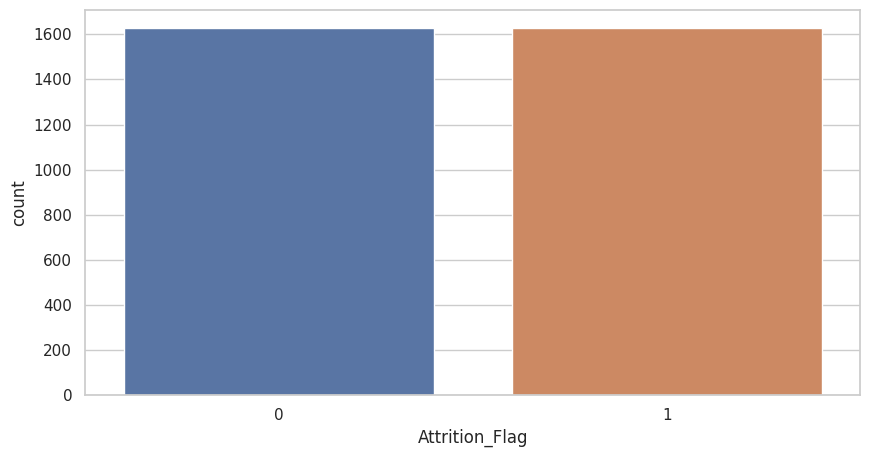

Optimization terminated successfully.
         Current function value: 0.388484
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                 3254
Model:                          Logit   Df Residuals:                     3242
Method:                           MLE   Df Model:                           11
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.4395
Time:                        10:37:32   Log-Likelihood:                -1264.1
converged:                       True   LL-Null:                       -2255.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        6.3103      0.452     13.960      0.000       5.424       7.196
Gender                      -0.8024      0.172     -4.678      0.000      -1.139      -0.466
Income_Category              0.1243      0.056      2.202      0.028       0.014       0.235
Dependent_count              0.1072      0.040      2.692      0.007       0.029       0.185
Months_on_book              -0.0189      0.006     -2.941      0.003      -0.032      -0.006
Total_Relationship_Count    -0.3628      0.034    -10.709      0.000      -0.429      -0.296
Months_Inactive_12_mon       0.5729      0.054     10.524      0.000       0.466       0.680
Contacts_Count_12_mon        0.5321      0.048     11.027      0.000       0.438       0.627
Total_Amt_Chng_Q4_Q1        -1.0666      0.253     -4.209      0.000      -1.563      -0.570
Total_Trans_Amt              9.4906      0.571     16.635      0.000       8.372      10.609
Total_Trans_Ct              -0.1207      0.005    -23.629      0.000      -0.131      -0.111
Total_Ct_Chng_Q4_Q1         -2.3476      0.235     -9.976      0.000      -2.809      -1.886
============================================================================================
"""

In [124]:
# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         #'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

y = data['Attrition_Flag'] # variable de salida


# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                #'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()




# Balaceamos los datos:

balanceo = True # le damos la opción de que si balancee los datos
tipo_balanceo=1 # el tipo de balanceo:

# = 1 --> under sampling
# = 2 --> over sampling
# = 3 --> SMOTE (es under y over sampling)
# = 4 --> SMOTE con corrección 1
# = 5 --> SMOTE con corrección 2

if balanceo:
    # Copio en un nuevo data frame los datos originiales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum['idx'] = idx
    X_dum.head()

    Y_dum = y.copy()
    
    # Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek

    if tipo_balanceo==1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo==2:
        rus = RandomOverSampler(random_state=0)    
    if tipo_balanceo==3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo==4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo==5:
        rus = SMOTETomek(random_state=0)

    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(['idx'],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b,columns=[var_y])

    # Barplot de la variable output- frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y,data = y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

# Modelo logistico con stats model:
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

In [125]:
# performing predictions on the test datdaset
yhat = logit_model.predict()
prediction = list(map(round, yhat))

print('**************************************')
print('Predicción con datos de training:')
print('**************************************')
print(accuracy_score(y, prediction))
print(np.transpose(confusion_matrix(y, prediction)))
print(classification_report(prediction,y))

**************************************
Predicción con datos de training:
**************************************
0.828518746158574
[[1334  265]
 [ 293 1362]]
              precision    recall  f1-score   support

           0       0.82      0.83      0.83      1599
           1       0.84      0.82      0.83      1655

    accuracy                           0.83      3254
   macro avg       0.83      0.83      0.83      3254
weighted avg       0.83      0.83      0.83      3254



El acierto es un 80% aproximadamente para los "1"

Nos estamos acercando a un clasificador más o menos digno.

Vamos a ver si aumentamos el número de muestras de 1 con un método híbrido:

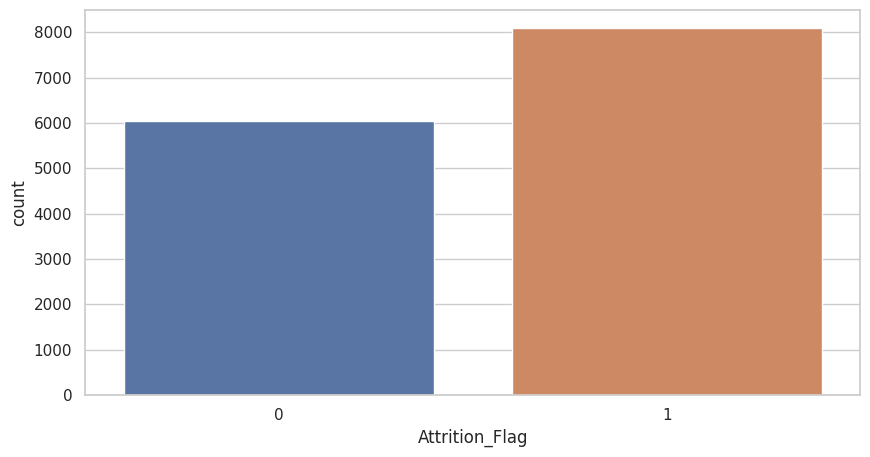

Optimization terminated successfully.
         Current function value: 0.260675
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         Attrition_Flag   No. Observations:                14139
Model:                          Logit   Df Residuals:                    14127
Method:                           MLE   Df Model:                           11
Date:                Thu, 06 Apr 2023   Pseudo R-squ.:                  0.6182
Time:                        10:37:33   Log-Likelihood:                -3685.7
converged:                       True   LL-Null:                       -9652.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       12.0723      0.301     40.093      0.000      11.482      12.662
Gender                      -1.1586      0.108    -10.700      0.000      -1.371      -0.946
Income_Category              0.0436      0.036      1.196      0.232      -0.028       0.115
Dependent_count             -0.0636      0.025     -2.575      0.010      -0.112      -0.015
Months_on_book              -0.0268      0.004     -6.899      0.000      -0.034      -0.019
Total_Relationship_Count    -0.6145      0.022    -27.975      0.000      -0.658      -0.571
Months_Inactive_12_mon       0.5072      0.032     15.692      0.000       0.444       0.571
Contacts_Count_12_mon        0.4315      0.030     14.228      0.000       0.372       0.491
Total_Amt_Chng_Q4_Q1        -0.8815      0.168     -5.242      0.000      -1.211      -0.552
Total_Trans_Amt             10.5923      0.319     33.205      0.000       9.967      11.217
Total_Trans_Ct              -0.1732      0.003    -52.135      0.000      -0.180      -0.167
Total_Ct_Chng_Q4_Q1         -2.6656      0.162    -16.429      0.000      -2.984      -2.348
============================================================================================
"""

In [126]:
# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         #'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

y = data['Attrition_Flag'] # variable de salida


# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                #'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()




# Balaceamos los datos:

balanceo = True # le damos la opción de que si balancee los datos
tipo_balanceo=4 # el tipo de balanceo:

# = 1 --> under sampling
# = 2 --> over sampling
# = 3 --> SMOTE (es under y over sampling)
# = 4 --> SMOTE con corrección 1
# = 5 --> SMOTE con corrección 2

if balanceo:
    # Copio en un nuevo data frame los datos originiales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum['idx'] = idx
    X_dum.head()

    Y_dum = y.copy()
    
    # Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek

    if tipo_balanceo==1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo==2:
        rus = RandomOverSampler(random_state=0)    
    if tipo_balanceo==3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo==4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo==5:
        rus = SMOTETomek(random_state=0)

    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(['idx'],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b,columns=[var_y])

    # Barplot de la variable output- frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y,data = y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

# Modelo logistico con stats model:
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

In [127]:
# performing predictions on the test datdaset
yhat = logit_model.predict()
prediction = list(map(round, yhat))

print('**************************************')
print('Predicción con datos de training:')
print('**************************************')
print(accuracy_score(y, prediction))
print(np.transpose(confusion_matrix(y, prediction)))
print(classification_report(prediction,y))

**************************************
Predicción con datos de training:
**************************************
0.8988613056086003
[[5269  650]
 [ 780 7440]]
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      5919
           1       0.92      0.91      0.91      8220

    accuracy                           0.90     14139
   macro avg       0.90      0.90      0.90     14139
weighted avg       0.90      0.90      0.90     14139



Es más optimista ya que tenemos más datos para entrenar.

Vamos a ver si con estas variables seleccionadas los algoritmos de machine learning funcionan mejor.

No olvides que un modelo logístico es un algoritmo básico dentro de las técnicas de machine learning.

Pero antes vamos a calcular un árbol clasificador para interpretar los resultados.

¡A por ello!

# Árboles de decisión

Tanto el modelo logístico (modelo estadístico) como el que vamos a calcular ahora, el árbol de decisión son herramientas ideales para interpretar el problema.

Son dos métodos que uso antes de calcular un algoritmo ya que me ayudan a entender el problema.

El árbol clasificador o decisión es en sí un algoritmo clasificador de machine learning pero la ventaja que tiene son sus mapas tipo árbol que son autoexplicativos y muy interesantes a la hora de presentar resultados.

El problema de los árboles es que tienden al overfitting, es decir, tienden a buscar el error 0 y no generalizan bien.

Por ello es muy importante conocer cómo podar lso árboles para que sea los más generales posibles y nos permita explicar el sistema de forma global.

Por ello lo que vamos a hacer es dividir los datos en training y test (split data) para calcular el error por datos de validación y de training:

Lo que vamos a es a balancear los datos con down sampling para coger solo datos reales y poder interpretar los resultados:

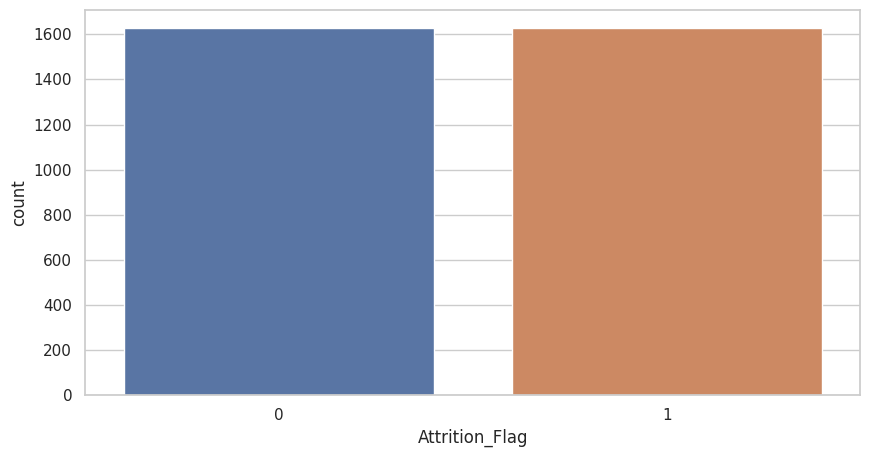

____________________________________
Las variables de entrada son:


,Gender,Income_Category,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,1,4,2,31,2,1,3,0.710,0.688105,104,0.825
1,0,1,2,47,4,2,3,0.758,0.224324,73,0.921
2,0,1,2,36,3,3,0,0.876,0.030488,34,0.889
3,1,5,1,39,4,2,2,0.609,0.051463,38,0.462
4,0,1,0,48,3,3,4,0.672,0.212974,77,0.925


In [128]:
# Seleccionamos las variable de entrada y salida:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         #'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

y = data['Attrition_Flag'] # variable de salida


# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Gender',(la hemos convertido) 
                #'Education_Level'
                #'Income_Category'(la hemos convertido)
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()

# Balaceamos los datos:

balanceo = True # le damos la opción de que si balancee los datos
tipo_balanceo=1 # el tipo de balanceo:

# = 1 --> under sampling
# = 2 --> over sampling
# = 3 --> SMOTE (es under y over sampling)
# = 4 --> SMOTE con corrección 1
# = 5 --> SMOTE con corrección 2

if balanceo:
    # Copio en un nuevo data frame los datos originiales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum['idx'] = idx
    X_dum.head()

    Y_dum = y.copy()
    
    # Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek

    if tipo_balanceo==1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo==2:
        rus = RandomOverSampler(random_state=0)    
    if tipo_balanceo==3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo==4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo==5:
        rus = SMOTETomek(random_state=0)

    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(['idx'],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b,columns=[var_y])

    # Barplot de la variable output- frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y,data = y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

print('____________________________________')
print('Las variables de entrada son:')
X.head()

## Árbol con condiciones pre podado (pre pruning)

El tamaño final que adquiere un árbol puede controlarse mediante reglas de parada que detengan la división de los nodos dependiendo de si se cumplen o no determinadas condiciones. El nombre de estas condiciones puede variar dependiendo del software o librería empleada, pero suelen estar presentes en todos ellos.

- Observaciones mínimas para división: define el número mínimo de observaciones que debe tener un nodo para poder ser dividido. Cuanto mayor el valor, menos flexible es el modelo.

- Observaciones mínimas de nodo terminal: define el número mínimo de observaciones que deben tener los nodos terminales. Su efecto es muy similar al de observaciones mínimas para división.

- Profundidad máxima del árbol: define la profundidad máxima del árbol, entendiendo por profundidad máxima el número de divisiones de la rama más larga (en sentido descendente) del árbol. Cuanto menor el valor, menos flexible es el modelo.

- Número máximo de nodos terminales: define el número máximo de nodos terminales que puede tener el árbol. Una vez alcanzado el límite, se detienen las divisiones. Su efecto es similar al de controlar la profundidad máxima del árbol.

- Reducción mínima de error: define la reducción mínima de error que tiene que conseguir una división para que se lleve a cabo.

Todos estos parámetros son lo que se conoce como hiperparámetros porque no se aprenden durante el entrenamiento del modelo. Su valor tiene que ser especificado por el usuario en base a su conocimiento del problema y mediante el uso de estrategias de validación.

In [129]:
# Creación del modelo
# ------------------------------------------------------------------------------
modelo = DecisionTreeClassifier(
            max_depth         = 5,
            min_samples_leaf  = 10 ,
            criterion         = 'gini',
            random_state      = 123
          )

# Entrenamiento del modelo
# ------------------------------------------------------------------------------
modelo.fit(X, y)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=10, random_state=123)

Profundidad del árbol: 5
Número de nodos terminales: 28


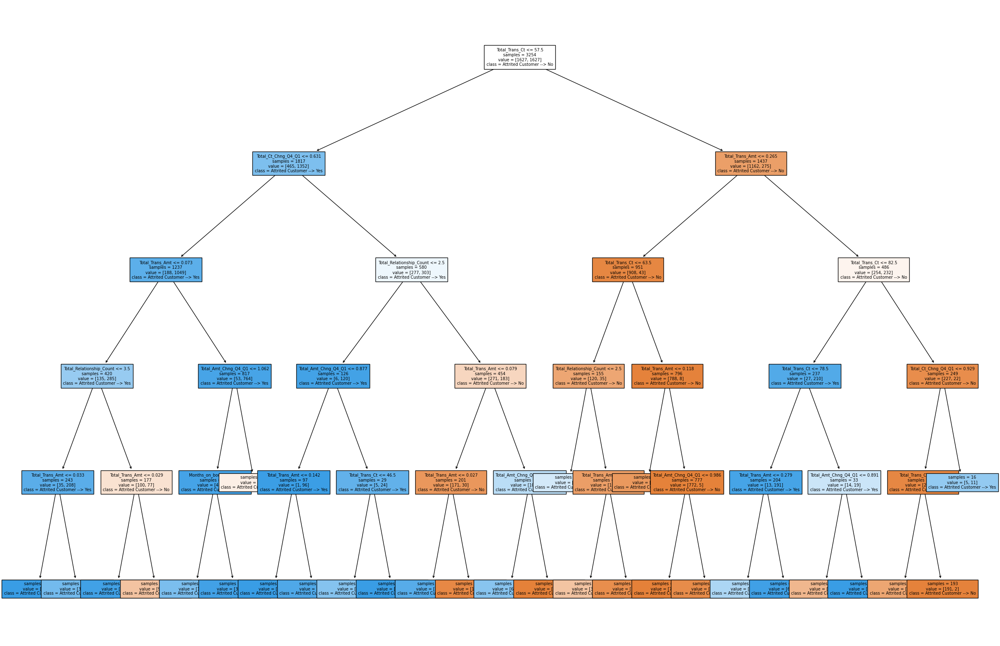

In [130]:
# Estructura del árbol creado
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text

# ------------------------------------------------------------------------------
sns.reset_defaults()
fig, ax = plt.subplots(figsize=(30, 20))

print(f"Profundidad del árbol: {modelo.get_depth()}")
print(f"Número de nodos terminales: {modelo.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo,
            feature_names = X.columns,
            class_names   = ['Attrited Customer --> No','Attrited Customer --> Yes'],
            filled        = True,
            impurity      = False,
            fontsize      = 7,
            ax            = ax
       )
plt.show()

In [131]:
# Error de test del modelo
#-------------------------------------------------------------------------------
predicciones = modelo.predict(X = X,)

print("Matriz de confusión")
print("-------------------")
confusion_matrix(
            y,
            predicciones
)

Matriz de confusión
-------------------


array([[1451,  176],
       [ 120, 1507]])

In [132]:
accuracy = accuracy_score(
            y,
            predicciones,
            normalize = True
           )
print(f"El accuracy de test es: {100 * accuracy} %")

El accuracy de test es: 90.90350338045482 %


## Podado del árbol de decisión¶

Aunque inicialmente se ha empleado un valor de max_depth=5, este no tiene por qué ser el mejor valor. Con el objetivo de identificar la profundidad óptima que consigue reducir la varianza y aumentar la capacidad predictiva del modelo, se somete al árbol a un proceso de pruning.

Buscamos el valor mínimo del error de validación cruzada y ahí estará nuestro valor de cp óptimo que usaremos para recalcular el árbol con el prunning.

Usaremos el árbol clasificador con condiciones por defecto.

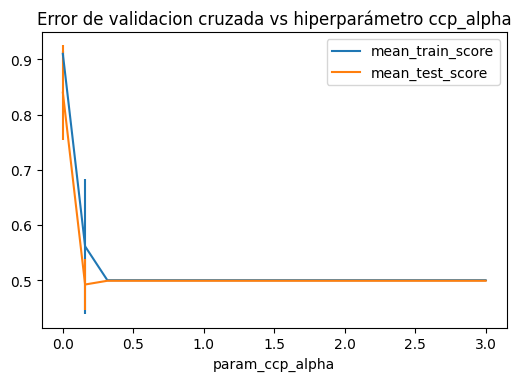

In [133]:
# Post pruning (const complexity pruning) por validación cruzada
# ------------------------------------------------------------------------------
# Valores de ccp_alpha evaluados
param_grid = {'ccp_alpha':np.linspace(0, 3, 20)}

# Búsqueda por validación cruzada
grid = GridSearchCV(
        # El árbol se crece al máximo posible antes de aplicar el pruning
        estimator = DecisionTreeClassifier(
                            max_depth         = 5,
                            min_samples_split = 2,
                            min_samples_leaf  = 10,
                            random_state      = 123
                       ),
        param_grid = param_grid,
        scoring    = 'accuracy',
        cv         = 10,
        refit      = True,
        return_train_score = True
      )

grid.fit(X, y)

fig, ax = plt.subplots(figsize=(6, 3.84))
scores = pd.DataFrame(grid.cv_results_)
scores.plot(x='param_ccp_alpha', y='mean_train_score', yerr='std_train_score', ax=ax)
scores.plot(x='param_ccp_alpha', y='mean_test_score', yerr='std_test_score', ax=ax)
ax.set_title("Error de validacion cruzada vs hiperparámetro ccp_alpha");
plt.show()

In [134]:
# Mejor valor ccp_alpha encontrado
# ------------------------------------------------------------------------------
grid.best_params_

{'ccp_alpha': 0.0}

Una vez identificado el valor óptimo de ccp_alpha, se reentrena el árbol indicando este valor en sus argumentos. Si en el GridSearchCV() se indica refit=True, este reentrenamiento se hace automáticamente y el modelo resultante se encuentra almacenado en .best_estimator_.

In [135]:
# Estructura del árbol final
# ------------------------------------------------------------------------------
modelo_final = grid.best_estimator_
print(f"Profundidad del árbol: {modelo_final.get_depth()}")
print(f"Número de nodos terminales: {modelo_final.get_n_leaves()}")

Profundidad del árbol: 5
Número de nodos terminales: 28


In [136]:
# Error de test del modelo final
#-------------------------------------------------------------------------------
predicciones = modelo_final.predict(X = X)

accuracy = accuracy_score(
            y,
            predicciones,
            normalize = True
           )
print(f"El accuracy de test es: {100 * accuracy} %")

El accuracy de test es: 90.90350338045482 %


Profundidad del árbol: 5
Número de nodos terminales: 28


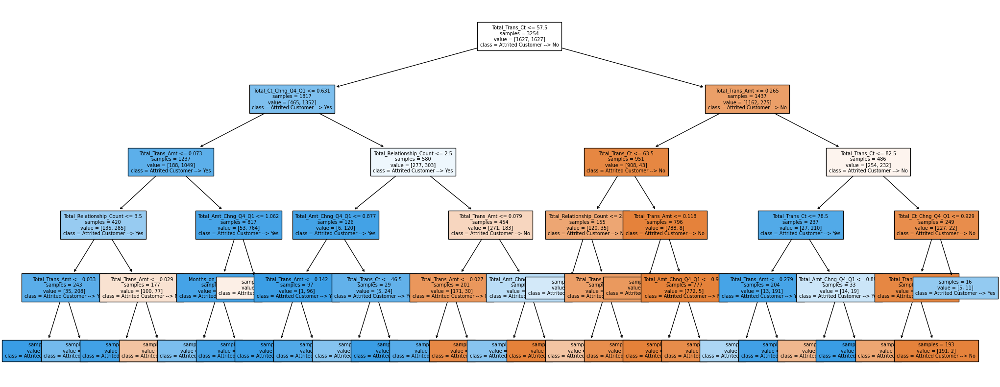

In [137]:
# Estructura del árbol creado
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text

# ------------------------------------------------------------------------------
sns.reset_defaults()
fig, ax = plt.subplots(figsize=(25, 10))

print(f"Profundidad del árbol: {modelo_final.get_depth()}")
print(f"Número de nodos terminales: {modelo_final.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo_final,
            feature_names = X.columns,
            class_names   = ['Attrited Customer --> No','Attrited Customer --> Yes'],
            filled        = True,
            impurity      = False,
            fontsize      = 7,
            ax            = ax
       )
plt.show()

# Training clasificador

Por útltimo vamos a entrenar el clasificador siguiendo los pasos:
- Definir entradas - salidas según el feature selection - nos basaremos en la selección manual del punto 6 balanceado.
- Data split
- Balancear los datos
- Definir las opciones de training
- Training con algoritmos básicos con los datos sin estandarizar
- Training con algoritmos básicos con los datos estandarizados
- Realizar predicciones con el modelo ganador

## Definir entradas - salidas según el feature selection

In [138]:
# Seleccionamos las variable de entrada y salida según lo analizado en el punto 6.2:

# quitamos aquellas variables que no teníamos patrones:
var_x = ['Gender', 
         #'Education_Level',
         #'Marital_Status', 
         'Income_Category',
         #'Card_Category'
         #'Customer_Age',
         'Dependent_count',
         'Months_on_book',
         'Total_Relationship_Count',
         'Months_Inactive_12_mon',
         'Contacts_Count_12_mon',
         #'Credit_Limit',
         #'Total_Revolving_Bal',
         #'Avg_Open_To_Buy',
         'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt',
         'Total_Trans_Ct',
         'Total_Ct_Chng_Q4_Q1',
         #'Avg_Utilization_Ratio'
         ]
X = data[var_x]

y = data['Attrition_Flag'] # variable de salida


# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['Attrition_Flag'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de Attrition_Flag:
var_x_drop = [#'Income_Category_Unknown',(la hemos convertido)
              #'Income_Category_$120K +',(la hemos convertido)
              #'Education_Level_Unknown',
              #'Education_Level_Post-Graduate',
              #'Education_Level_Doctorate',
              #'Education_Level_Uneducated'
              #'',
              #'',
              #''
              ]

X = X.drop(columns = var_x_drop)
X.head()

,Gender,Income_Category,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,1,3,3,39,5,1,3,1.335,0.035273,42,1.625
1,0,1,5,44,6,1,2,1.541,0.043452,33,3.714
2,1,4,3,36,4,1,0,2.594,0.076611,20,2.333
3,0,1,4,34,3,4,1,1.405,0.036775,20,2.333
4,1,3,3,21,5,1,0,2.175,0.017025,28,2.500


## Data split

Partimos los datos en 80% 20%:

In [139]:
validation_size = 0.2 # proporción para validar
seed_partition = 70 # el número aleatorio
seed = 7

# X_train, X_validation, Y_train, Y_validation = train_test_split(X_Boruta, y, test_size=validation_size, random_state=seed)
X_train, X_validation, Y_train, Y_validation = train_test_split(X, y, test_size=validation_size, random_state=seed_partition)
# X_train, X_validation, Y_train, Y_validation = train_test_split(X, y, test_size=validation_size, random_state=seed)

## Balancear los datos

Este sistema nos ayuda a balancear el problema.

El proceso de balanceo hay varios tipos que puedes aplicar. En este proceso se han implementado 5:
- 1 --> under sampling
- 2 --> over sampling
- 3 --> SMOTE (es under y over sampling)
- 4 --> SMOTE con corrección 1
- 5 --> SMOTE con corrección 2

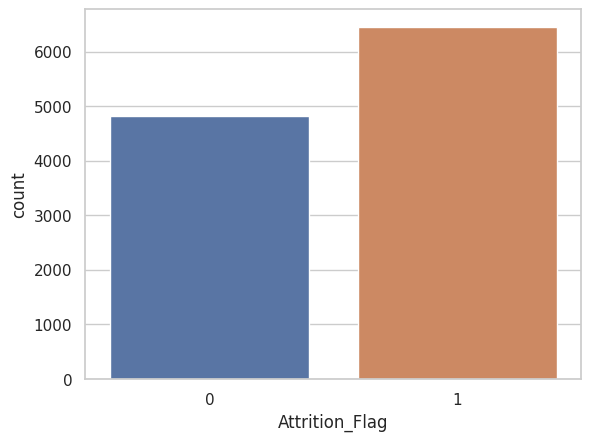

____________________________________
Las variables de entrada son:


,Gender,Income_Category,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,1,3,3,39,5,1,3,1.335,0.035273,42,1.625
1,0,1,5,44,6,1,2,1.541,0.043452,33,3.714
2,1,4,3,36,4,1,0,2.594,0.076611,20,2.333
3,0,1,4,34,3,4,1,1.405,0.036775,20,2.333
4,1,3,3,21,5,1,0,2.175,0.017025,28,2.500


In [140]:
# Balaceamos los datos:

balanceo = True # le damos la opción de que si balancee los datos
tipo_balanceo=4 # el tipo de balanceo:

# = 1 --> under sampling
# = 2 --> over sampling
# = 3 --> SMOTE (es under y over sampling)
# = 4 --> SMOTE con corrección 1
# = 5 --> SMOTE con corrección 2

if balanceo:
    # Copio en un nuevo data frame los datos originiales para entrenar
    X_dum = X_train.copy()
    idx = X_train.index
    X_dum['idx'] = idx
    X_dum.head()

    Y_dum = Y_train.copy()
    
    # Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek

    if tipo_balanceo==1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo==2:
        rus = RandomOverSampler(random_state=0)    
    if tipo_balanceo==3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo==4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo==5:
        rus = SMOTETomek(random_state=0)

    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(['idx'],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b,columns=[var_y])

    # Barplot de la variable output- frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y,data = y_b_df)
    plt.show()
    
    X_train = X_b.copy()
    Y_train = y_b.copy()

print('____________________________________')
print('Las variables de entrada son:')
X.head()

____________________________________
DATOS DE TRAINING:


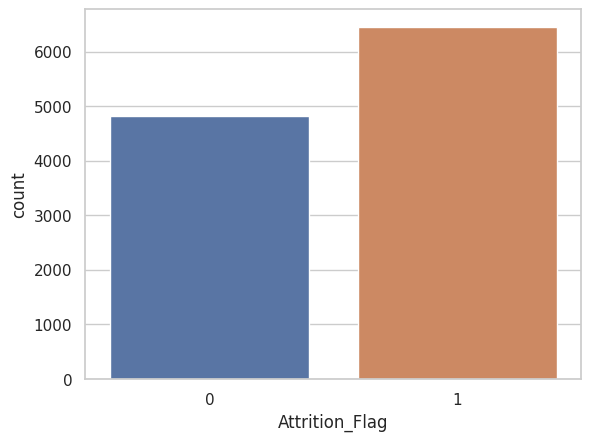

____________________________________
DATOS DE VALIDACIÓN:


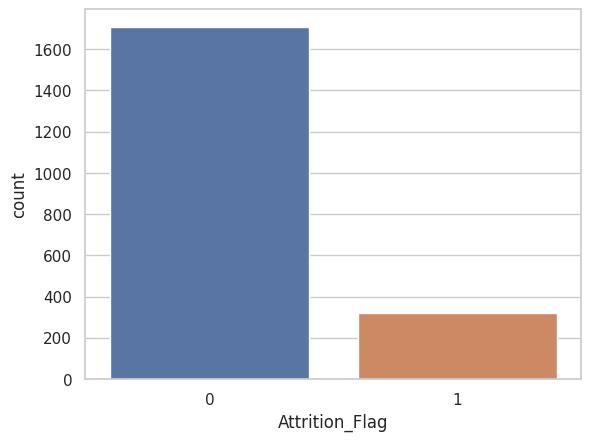

In [141]:
# Visualizamos los datos de training:

Y_train_df = pd.DataFrame(Y_train,columns=['Attrition_Flag'])

print('____________________________________')
print('DATOS DE TRAINING:')
# Barplot de la variable output- frecuencias absolutas
sns.set_theme(style="whitegrid")
ax = sns.countplot(x='Attrition_Flag',data = Y_train_df)
plt.show()


Y_validation_df = pd.DataFrame(Y_validation,columns=['Attrition_Flag'])


print('____________________________________')
print('DATOS DE VALIDACIÓN:')
# Barplot de la variable output- frecuencias absolutas
sns.set_theme(style="whitegrid")
ax = sns.countplot(x='Attrition_Flag',data = Y_validation_df)
plt.show()

## Definir las opciones de training

In [142]:
num_folds = 5
scoring = 'accuracy'

## Training con algoritmos básicos con los datos sin estandarizar

In [143]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))

In [144]:
results = []
names = []

# evaluamos los algoritmos basicos
for name, model in models:
    seed = 7
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('**************************************')
    print(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print('Predicción de Training:')
    print(msg)
    model.fit(X_train, Y_train) # fit del modelo
    # estimate accuracy on validation dataset
    print('Predicción de Validación:')
    predictions = model.predict(X_validation) # prediccion con los datos validacion
    print(accuracy_score(Y_validation, predictions))
    print(np.transpose(confusion_matrix(Y_validation, predictions)))
    print(classification_report(predictions,Y_validation))
    print('**************************************')


**************************************
LR
Predicción de Training:
LR: 0.900745 (0.006209)
Predicción de Validación:
0.7877591312931885
[[1320   42]
 [ 388  276]]
              precision    recall  f1-score   support

           0       0.77      0.97      0.86      1362
           1       0.87      0.42      0.56       664

    accuracy                           0.79      2026
   macro avg       0.82      0.69      0.71      2026
weighted avg       0.80      0.79      0.76      2026

**************************************
**************************************
LDA
Predicción de Training:
LDA: 0.902253 (0.006414)
Predicción de Validación:
0.7843040473840079
[[1317   46]
 [ 391  272]]
              precision    recall  f1-score   support

           0       0.77      0.97      0.86      1363
           1       0.86      0.41      0.55       663

    accuracy                           0.78      2026
   macro avg       0.81      0.69      0.71      2026
weighted avg       0.80      0.78   

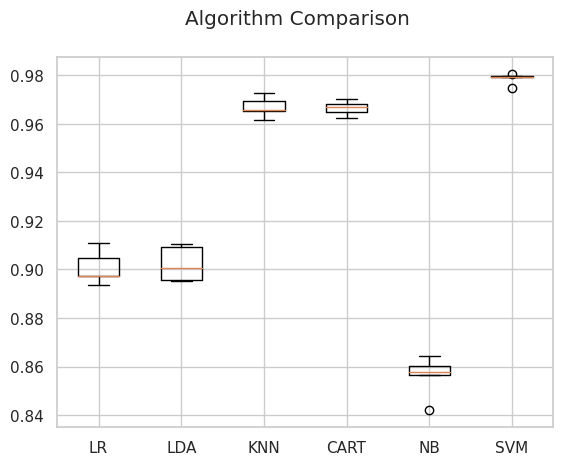

In [145]:
# Comparamos algoritmos
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Training con algoritmos básicos con los datos estandarizados

In [146]:
# Definimos el pipeline con estandarizacion y el modelo:
pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR', LogisticRegression(solver='liblinear'))])))
pipelines.append(('ScaledLDA', Pipeline([('Scaler', StandardScaler()),('LDA', LinearDiscriminantAnalysis())])))
pipelines.append(('ScaledKNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('ScaledNB', Pipeline([('Scaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('ScaledSVM', Pipeline([('Scaler', StandardScaler()),('SVM', SVC(gamma='auto'))])))

In [147]:
results = []
names = []

# evaluamos los algoritmos basicos
for name, model in pipelines:
    seed = 7
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('**************************************')
    print(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print('Predicción de Training:')
    print(msg)
    model.fit(X_train, Y_train) # fit del modelo
    # estimate accuracy on validation dataset
    print('Predicción de Validación:')
    predictions = model.predict(X_validation) # prediccion con los datos validacion
    print(accuracy_score(Y_validation, predictions))
    print(np.transpose(confusion_matrix(Y_validation, predictions)))
    print(classification_report(predictions,Y_validation))
    print('**************************************')


**************************************
ScaledLR
Predicción de Training:
ScaledLR: 0.900213 (0.006050)
Predicción de Validación:
0.7897334649555775
[[1326   44]
 [ 382  274]]
              precision    recall  f1-score   support

           0       0.78      0.97      0.86      1370
           1       0.86      0.42      0.56       656

    accuracy                           0.79      2026
   macro avg       0.82      0.69      0.71      2026
weighted avg       0.80      0.79      0.76      2026

**************************************
**************************************
ScaledLDA
Predicción de Training:
ScaledLDA: 0.902253 (0.006414)
Predicción de Validación:
0.7843040473840079
[[1317   46]
 [ 391  272]]
              precision    recall  f1-score   support

           0       0.77      0.97      0.86      1363
           1       0.86      0.41      0.55       663

    accuracy                           0.78      2026
   macro avg       0.81      0.69      0.71      2026
weighted avg

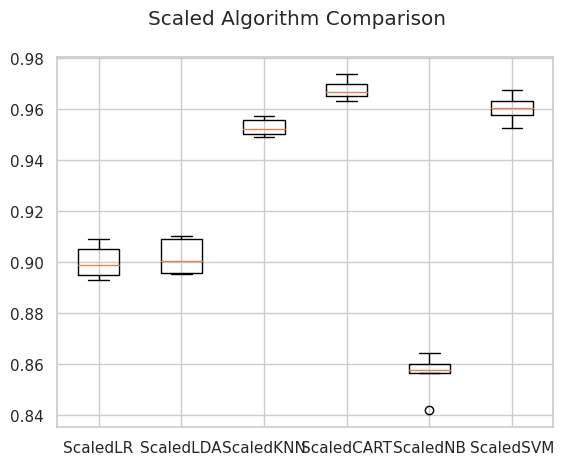

In [148]:
# Comparamos algoritmos
fig = plt.figure()
fig.suptitle('Scaled Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Algoritmos avanzados estandarizando los datos

In [149]:
# Definimos los algoritmos
ensembles = []
ensembles.append(('AB', AdaBoostClassifier()))
ensembles.append(('GBM', GradientBoostingClassifier()))
ensembles.append(('RF', RandomForestClassifier(n_estimators=10)))
ensembles.append(('ET', ExtraTreesClassifier(n_estimators=10)))

In [150]:
results = []
names = []

# evaluamos los algoritmos basicos
for name, model in ensembles:
    seed = 7
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('**************************************')
    print(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print('Predicción de Training:')
    print(msg)
    model.fit(X_train, Y_train) # fit del modelo
    # estimate accuracy on validation dataset
    print('Predicción de Validación:')
    predictions = model.predict(X_validation) # prediccion con los datos validacion
    print(accuracy_score(Y_validation, predictions))
    print(np.transpose(confusion_matrix(Y_validation, predictions)))
    print(classification_report(predictions,Y_validation))
    print('**************************************')


**************************************
AB
Predicción de Training:
AB: 0.958311 (0.002005)
Predicción de Validación:
0.8756169792694966
[[1478   22]
 [ 230  296]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.92      1500
           1       0.93      0.56      0.70       526

    accuracy                           0.88      2026
   macro avg       0.90      0.77      0.81      2026
weighted avg       0.88      0.88      0.86      2026

**************************************
**************************************
GBM
Predicción de Training:
GBM: 0.968955 (0.006192)
Predicción de Validación:
0.8859822309970385
[[1500   23]
 [ 208  295]]
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      1523
           1       0.93      0.59      0.72       503

    accuracy                           0.89      2026
   macro avg       0.90      0.79      0.82      2026
weighted avg       0.89      0.89   

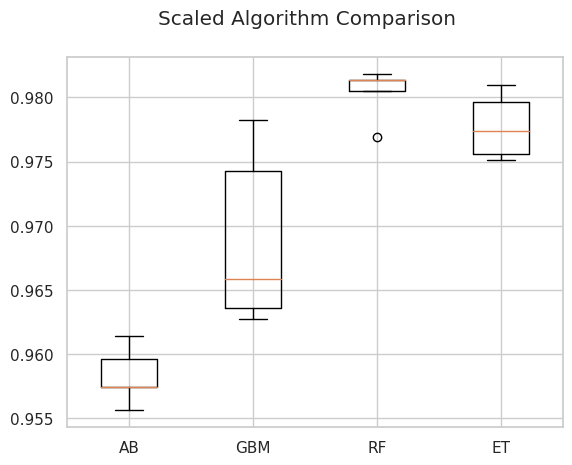

In [151]:
# Comparamos algoritmos
fig = plt.figure()
fig.suptitle('Scaled Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Modelo ganador:

Es el momento más divertido y es momento de mirar tanto los datos de training como los datos de validación.

El mejor algoritmo para datos de validación de Attrition_Flag es el CART con un 84% para Abandona y un 90% de NO Abandona.


In [152]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))

name = models[3][0]
model = models[3][1]

seed = 7
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
results.append(cv_results)
names.append(name)
print('**************************************')
print(name)
msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
print('Predicción de Training:')
print(msg)
model.fit(X_train, Y_train) # fit del modelo
# estimate accuracy on validation dataset
print('Predicción de Validación:')
predictions = model.predict(X_validation) # prediccion con los datos validacion
print(accuracy_score(Y_validation, predictions))
print(np.transpose(confusion_matrix(Y_validation, predictions)))
print(classification_report(predictions,Y_validation))
print('**************************************')

**************************************
CART
Predicción de Training:
CART: 0.968156 (0.004888)
Predicción de Validación:
0.8894373149062191
[[1534   50]
 [ 174  268]]
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      1584
           1       0.84      0.61      0.71       442

    accuracy                           0.89      2026
   macro avg       0.87      0.79      0.82      2026
weighted avg       0.89      0.89      0.88      2026

**************************************


El siguiente paso es probar con más variables y diferentes tipos de balanceos para poder seleccionar el mejor algoritmo teniendo en cuenta todas las posibilidades.

El training es un trabajo artesanal en los primeros momentos y una vez ya sabes cuál es el mejor algoritmo y vas teniendo más datos es cuestión de actualizarlo y optmizarlo.

Ahora ya sabes el paso a paso que tienes que dar para analizar un dataset con una estructura de un clasificador.

¡Enhorabuena!

Te toca aplicarlo a tus datos :))

# Predicciones con el modelo seleccionado y curva ROC

No Skill: ROC AUC=0.500
Model: ROC AUC=0.870


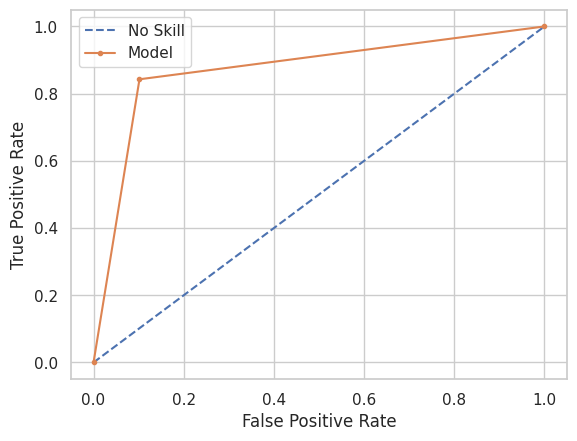

In [153]:
predictions_prob = model.predict_proba(X_validation) # predicción probabilidades

df_validation = pd.DataFrame(Y_validation)
df_validation.columns = ['Real']
df_validation['Prob_NO_abandona'] = predictions_prob[:,0]
df_validation['Prob_SI_abandona'] = predictions_prob[:,1]
df_validation['Prediccion'] = model.predict(X_validation)
df_validation['Error'] = abs(df_validation['Real']-df_validation['Prediccion'])
df_validation['Diff_Abs'] = abs(df_validation['Prob_NO_abandona']-df_validation['Prob_SI_abandona'])


# roc curve and auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

Y_validation_mod  = Y_validation
ns_probs = [0 for _ in range(len(Y_validation_mod))]
# predict probabilities
lr_probs = predictions_prob
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(Y_validation_mod, ns_probs)
lr_auc = roc_auc_score(Y_validation_mod, lr_probs)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Model: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(Y_validation_mod, ns_probs)
lr_fpr, lr_tpr, thresholds = roc_curve(Y_validation_mod, lr_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Model')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

In [154]:
# Puedes ver el resultados de los primeros 30 clientes real, predicción y las probabilidades que nos da el algoritmo:
df_validation.head(10)

,Real,Prob_NO_abandona,Prob_SI_abandona,Prediccion,Error,Diff_Abs
160,0,1.0,0.0,0,0,1.0
459,0,1.0,0.0,0,0,1.0
3418,1,0.0,1.0,1,0,1.0
8823,0,1.0,0.0,0,0,1.0
4520,0,1.0,0.0,0,0,1.0
8515,0,1.0,0.0,0,0,1.0
914,0,1.0,0.0,0,0,1.0
6458,0,1.0,0.0,0,0,1.0
5494,0,1.0,0.0,0,0,1.0
9151,0,1.0,0.0,0,0,1.0


In [155]:
import pickle as pkl

In [156]:
# Grabamos el modelo en el directorio
import pickle as pkl
pkl_filename = "pickle_model.pkl"
with open(pkl_filename, 'wb') as file:
    pkl.dump(model, file)

In [157]:
# Cargamos el modelo
pkl_filename = "pickle_model.pkl"
with open(pkl_filename, 'rb') as file:
    model = pkl.load(file)

In [158]:
# Encontramos el accuracy promedio usando datos de test
score = model.score(X_validation, Y_validation)
print(score)

0.8894373149062191


In [159]:
#adaptar los valores para el array
#'Gender', 1 (M) ó 0 (F)
#'Income_Category', 
    #'Unknown']=0
    #'Less than $40K']=1
    #'$40K - $60K']=2
    #'$60K - $80K']=3
    #'$80K - $120K']=4
    #'$120K +']=5

#'Dependent_count',(max 5 min 0)
#'Months_on_book',(max 56 min 13)
#'Total_Relationship_Count',(max 6 min 1)
#'Months_Inactive_12_mon',(max 6 min 0)
#'Contacts_Count_12_mon',(max 5 min 0)
#'Total_Amt_Chng_Q4_Q1',(0.25 a 3.4)
#'Total_Trans_Amt',($816 a $18484)
#'Total_Trans_Ct',(11 a 139)
#'Total_Ct_Chng_Q4_Q1',(0.028 a 3.714)

x_in = np.asarray([0, 2 ,1, 36, 3, 2, 5, 0.33, 560, 5, 0.096]).reshape(1,-1)
predicts = model.predict(x_in)
predicts[0]

/home/mauro/Mis_proyectos_jupyter/Proyects/Codigos/abandono_cliente/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


1